# CLUSTER ANALYSIS ON FIFA20 DATASET

Association Football is arguably the most popular sport in the world and FIFA is the most popular football simulation game by Electronic Arts (EA Sports). 
We will be doing Clustering Analysis which is an unsupervised learning method to categorize similar players using their traits and their different skills in the field. We will be using K-means, Hierarchical and DBSCAN clustering ML algorithms and in the end compare all models to see which one performs better.

## Tasks to be performed

Task 1 :- Prepare a complete data analysis report on the given data.

Task 2 :- Explore football skills and cluster football players based on their attributes.

Task 3 :- Explore the data and attempt all the below asked questions:
1. Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that   play at this level?

2. Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?

3. Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger? 


## Import basic libraries

In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.offline as pyo
pyo.init_notebook_mode()
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

## Reading the given fifa20 dataset

In [2]:
data = pd.read_csv('players_20.csv')

## Basic checks

In [3]:
# Checking the Shape and Size of the dataset

print(data.shape)
print(data.size)

(18278, 104)
1900912


#### OBSERVATION:
> There are over 18,000+ Rows and 100+ Columns in the Dataset and 19 lakhs elements in the dataset

In [4]:
# Checking the first 5 Rows of the dataset using head function

pd.set_option('display.max_columns', None) # For displaying all the columns
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,

## Domain Analysis 
- Name: Name of the player. 
- Age: Age of the player.
- Height: Height of the player in inches (transformed to centimeters in preprocessing).
- Overall: General performance quality and value of the player representing the key positional skills and international reputation rated between 1-99. 
- Potential: Maximum Overall rating expected to be reached by a player in the top of his career rated between 1-99.
- PreferredFoot: Right or Left. Label encoder is applied as 0 for left and 1 for right.
- WeakFoot: Represents how well a player uses his weak foot (e.g. left for righties) rated between 1 to 5.
- WorkRate: Degree of the effort the player puts in terms of attack and defense rated as low, medium and high. This feature is divided into two new features as AttackWorkRate and DefenseWorkRate.
- Position: Position of the players on the pitch which determines their roles and responsibilities in the team. Forward positions in the football and players can be grouped as striker (ST: center striker, RS: right striker, LS: left striker), forward (CF: center forward, RF: right forward, LF: left forward) and winger (RW: right winger, LW: left winger). 

In [5]:
# Displaying the datatypes of the columns

data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 104 columns):
 #    Column                      Non-Null Count  Dtype  
---   ------                      --------------  -----  
 0    sofifa_id                   18278 non-null  int64  
 1    player_url                  18278 non-null  object 
 2    short_name                  18278 non-null  object 
 3    long_name                   18278 non-null  object 
 4    age                         18278 non-null  int64  
 5    dob                         18278 non-null  object 
 6    height_cm                   18278 non-null  int64  
 7    weight_kg                   18278 non-null  int64  
 8    nationality                 18278 non-null  object 
 9    club                        18278 non-null  object 
 10   overall                     18278 non-null  int64  
 11   potential                   18278 non-null  int64  
 12   value_eur                   18278 non-null  int64  
 13   wage_eur      

#### OBSERVATION:

From the above line we got the data types of our features.

* data types: float64(16), int64(45), object(43)

We must note that we need to deal with object data types as numeric data is preferred for training models well.

The following columns: release_clause_eur, player_tags, team_position, team_jersey_number, loaned_from, joined, contract_valid_until, nation_position, nation_jersey_number, pace, shooting, passing, dribbling, defending, physic, gk_diving, gk_handling, gk_kicking, gk_reflexes, gk_speed, gk_positioning, player_traits, ls, st, rs, lw, lf, cf, rf, rw, lam, cam, ram, lm, lcm, cm, rcm, rm, lwb, ldm, cdm, rdm, rwb, lb, lcb, cb, rcb, rb has missing values

In [6]:
# Basic Statistic of the Dataset

data.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,18278.000000,1.698000e+04,18038.000000,18038.000000,1126.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,2.368038,4.740717e+06,20.103892,2021.114591,12.114565,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,49.718405,45.590218,52.221468,58.748003,42.809388,55.596509,47.325692,42.708885,52.768848,58.461976,64.299923,64.415746,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,46.812945,55.742149,46.380239,50.072163,53.609749,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,0.765038,1.103002e+07,16.603639,1.289888,6.735922,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,7.736278,7.244023,7.510709,8.154062,10.634038,8.447876,18.325403,19.594609,17.428429,14.679653,17.701815,18.929118,18.422991,17.433612,15.246454,16.741878,15.042232,14.847763,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,19.322343,17.318157,20.775812,19.594022,13.955626,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,1.300000e+04,1.000000,2019.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,44.000000,42.000000,35.000000,45.000000,12.000000,41.000000,5.000000,2.000000,5.000000,7.000000,3.000000,4.000000,6.000000,4.000000,8.000000,5.000000,12.000000,11.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,4.000000,9.000000,3.000000,2.000000,9.000000,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,5.630000e+05,9.000000,2020.000000,6.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,60.000000,58.000000,57.000000,60.750000,29.000000,58.000000,38.000000,30.000000,44.000000,54.000000,30.000000,50.000000,34.000000,31.000000,43.000000,54.000000,56.000000,57.

In [7]:
data.describe(include='O')

,player_url,short_name,long_name,dob,nationality,club,player_positions,preferred_foot,work_rate,body_type,real_face,player_tags,team_position,loaned_from,joined,nation_position,player_traits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
count,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,1499,18038,1048,16990,1126,7566,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242
unique,18278,17354,18218,6142,162,698,643,2,9,10,2,83,29,316,1760,26,921,94,94,94,107,103,103,103,107,103,103,103,100,88,88,88,100,98,98,98,98,98,96,110,110,110,96
top,https://sofifa.com/player/158023/lionel-messi/...,J. Rodríguez,Liam Kelly,1992-02-29,England,FC Barcelona,CB,Right,Medium/Medium,Normal,No,#Strength,SUB,Sassuolo,2019-07-01,SUB,Early Crosser,61+2,61+2,61+2,63+2,63+2,63+2,63+2,63+2,61+2,61+2,61+2,61+2,58+2,58+2,58+2,61+2,59+2,59+2,59+2,59+2,59+2,61+2,63+2,63+2,63+2,61+2
freq,1,11,3,113,1667,33,2322,13960,9875,10750,16310,514,7820,17,1465,587,501,725,725,725,736,727,727,727,736,748,748,748,809,775,775,775,809,682,636,636,636,682,667,621,621,621,667


## Exploratory Data Analysis

###  Univariate Analysis

In [8]:
# Displaying the distribution of the following features

data_age=data[['age','height_cm','weight_kg']]

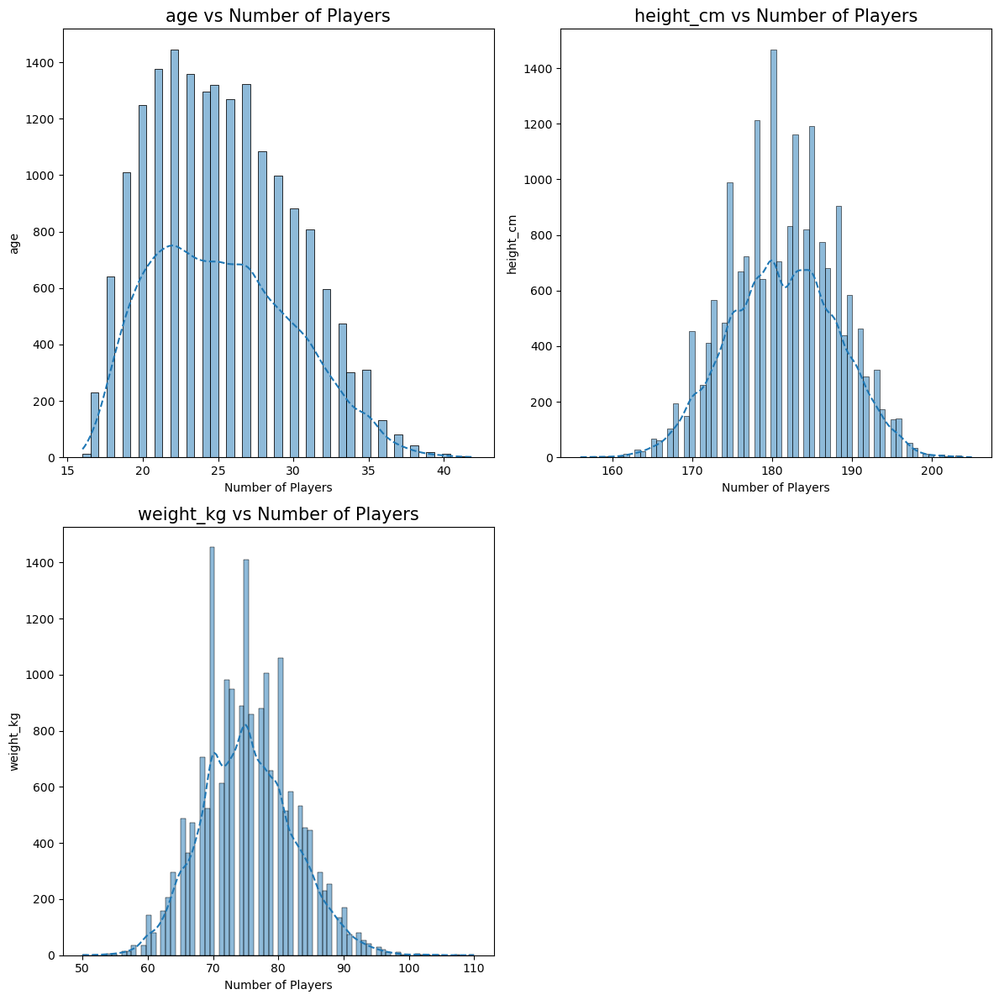

In [9]:
# Displaying the distribution of the following features
plt.figure(figsize=(12,12),facecolor='white', dpi=100)
plotnumber= 1

for column in data_age:
    if plotnumber <=10:
        
        ax= plt.subplot(2,2,plotnumber)
        sns.histplot(x=data_age[column],kde=True, line_kws= {'linestyle': 'dashed'})
        
        plt.xlabel('Number of Players',fontsize=10)
        plt.ylabel(column,fontsize=10)
        plt.title('{} vs Number of Players'.format(column),fontsize=15)
    plotnumber+=1
plt.tight_layout()


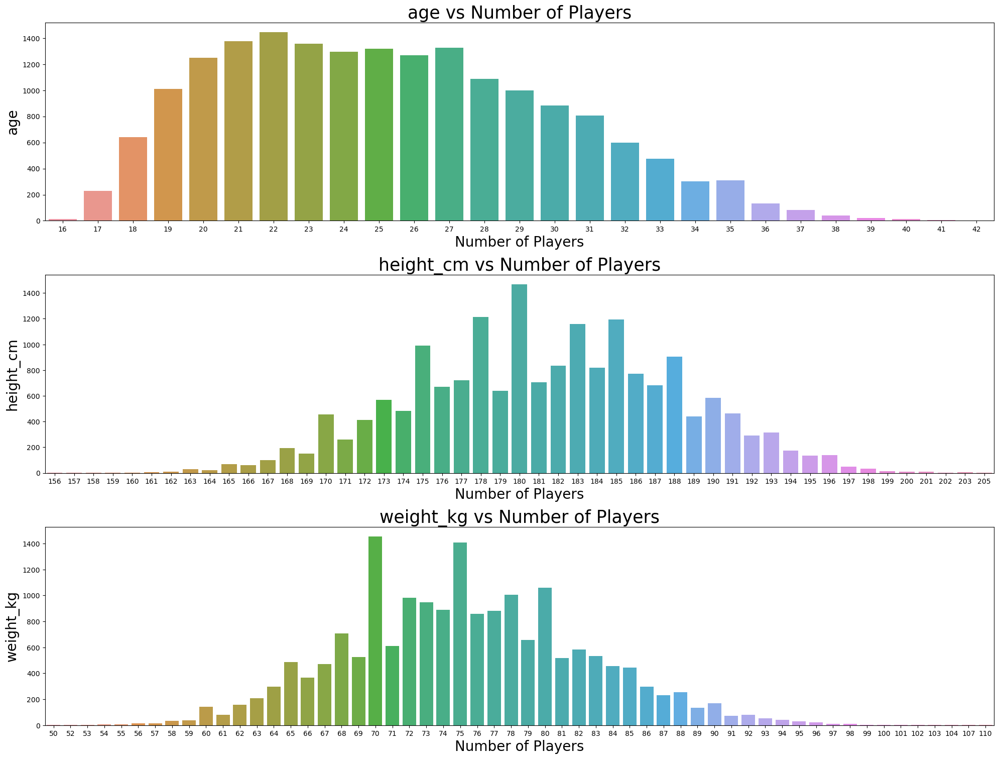

In [10]:
# Displaying the count of the following features

plt.figure(figsize=(20,100),facecolor='white',dpi=100)
plotnumber= 1

for column in data_age:
    if plotnumber <=20:
        
        ax= plt.subplot(20,1,plotnumber)
        sns.countplot(x=data_age[column],data=data_age)
        
        plt.xlabel('Number of Players',fontsize=20)
        plt.ylabel(column,fontsize=20)
        plt.title('{} vs Number of Players'.format(column),fontsize=25)
        
    plotnumber+=1
plt.tight_layout()

#### OBSERVATION:

> Most of the players are between age 21 to 27. There is heavy decline in the numbers of players after 35 years of age. There seems to have only six players in 41 and 42 age category. Three out of them are Goalkeepeers.

> Most of the players' height ranges between 175cm to 185 cm. Mean height of player is 181 cm. Shortest height of player in the game is 156cm and tallest player is 205cm.

> Maximum number of players lie in the weight range of 65 kg to 85 kg and the Mean weight of the players is 75 kg.


### Nationality of the Players

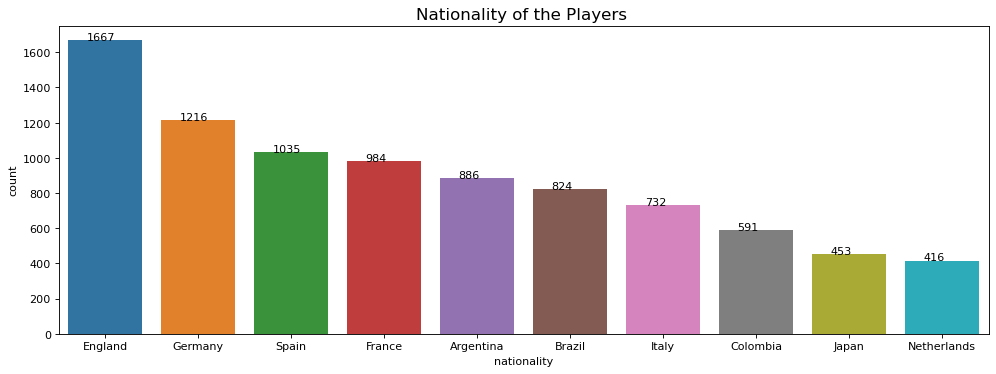

In [11]:
plt.figure(figsize=(15,5),facecolor='white',dpi=80)

ax=sns.countplot(x='nationality',order=data.nationality.value_counts().iloc[:10].index,data=data)
plt.title('Nationality of the Players ',fontsize=15)

for p in ax.patches:
    ax.annotate('{:1.0f}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()+0.01))

#### OBSERVATION: 

 England contributes the Most Playeers in Fifa 20 which is close to 10% of the total data.
 Germany and Spain are the 2nd and 3rd Respectively. 
 
 #### Top 10 Countries contributing Number of players:
  1. England    -- 1667
  2. Germany    -- 1216
  3. Spain      -- 1035
  4. France     --  984
  5. Argentina   -- 886
  6. Brazil      -- 824
  7. Italy       -- 732
  8. Colombia    -- 591
  9. Japan       -- 453
  10. Netherlands -- 416

### Overall Rating of the Players

Text(0.5, 1.0, 'Overall Rating of the Players')

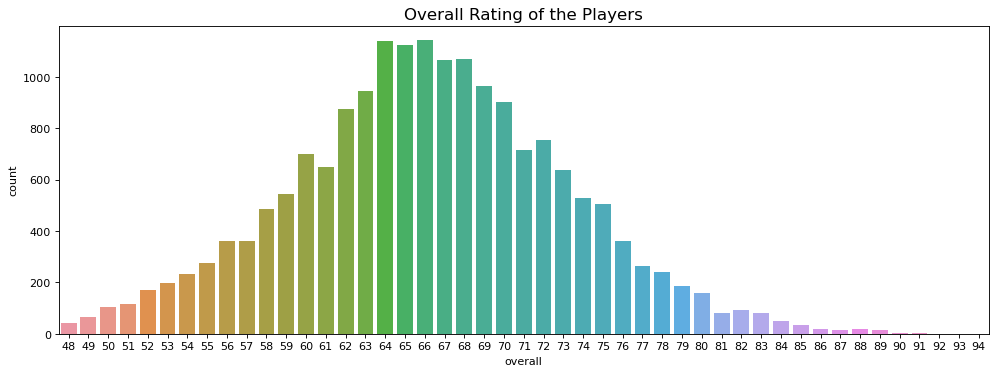

In [12]:
plt.figure(figsize = (15, 5), dpi = 80)

sns.countplot(x=data['overall'])
plt.title('Overall Rating of the Players',fontsize=15)

In [13]:
print('Min  :  ',data['overall'].min())
print('Mean :  ',data['overall'].mean())
print('Max  :  ',data['overall'].max())

Min  :   48
Mean :   66.24499398183609
Max  :   94


#### Top 10 Players with highest Overall Rating

In [14]:
data[['short_name','overall']].sort_values('overall',ascending=False).head(10)

,short_name,overall
0,L. Messi,94
1,Cristiano Ronaldo,93
2,Neymar Jr,92
3,J. Oblak,91
4,E. Hazard,91
5,K. De Bruyne,91
6,M. ter Stegen,90
7,V. van Dijk,90
8,L. Modrić,90
9,M. Salah,90


#### OBSERVATION :

> Most of the players fall between 60 to 70 overall rating. There is considerable decline in number after 70. A very few players fall above 85 overall rating.

> L.Messi has the highest overall rating

### Potential of the Players

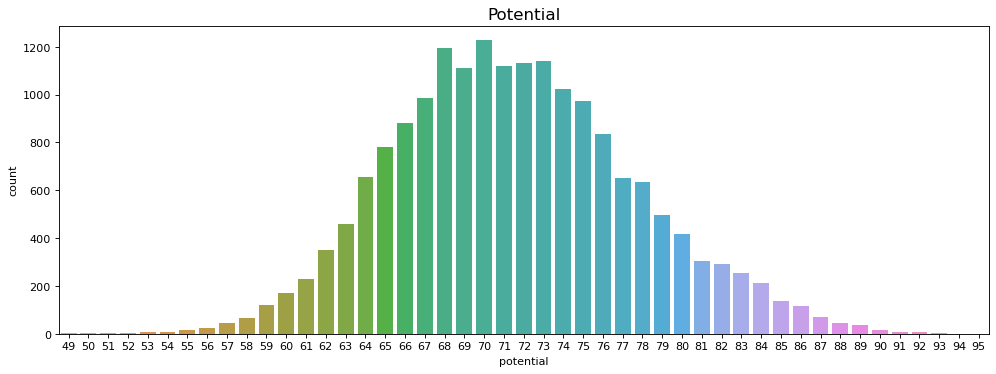

In [15]:
plt.figure(figsize = (15, 5), dpi = 80)

sns.countplot(x= data['potential'])
plt.title('Potential',fontsize=15)
plt.show()

### Top 10 Players with highest Potential

In [16]:
data[['short_name','potential']].sort_values('potential',ascending=False).head(10)

,short_name,potential
10,K. Mbappé,95
0,L. Messi,94
6,M. ter Stegen,93
73,M. de Ligt,93
1,Cristiano Ronaldo,93
411,João Félix,93
3,J. Oblak,93
74,G. Donnarumma,92
108,J. Sancho,92
109,K. Havertz,92


#### OBSERVATION: 
> Most of the players are expected to reach potential of around 70. There seems to have steady growth in potential till 70 and thereafter the graph declines. A few players are expected to show potential of above 85.

> K. Mbappe is expected reach overall rating of 95 surpassing L. Messi

### Value in Euro of the Players

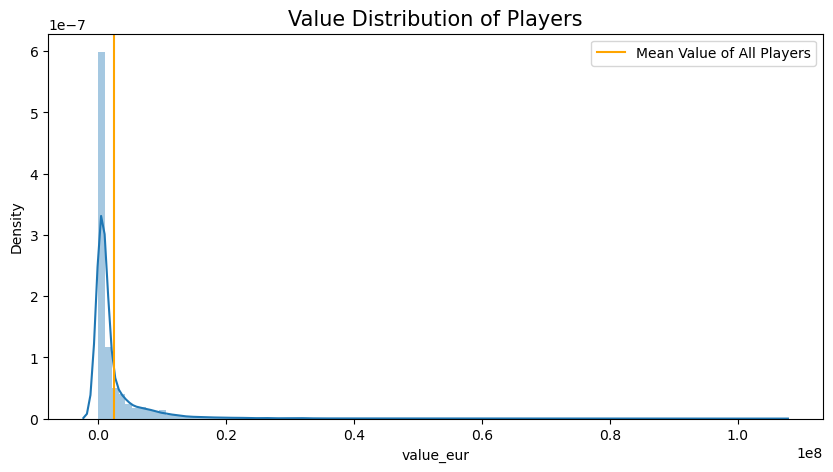

In [17]:
plt.figure(figsize = (10, 5), dpi = 100)

plt.title('Value Distribution of Players',fontsize=15)
sns.distplot(a = data['value_eur'], kde = True, bins = 100)
plt.axvline(x = np.mean(data['value_eur']), c = 'orange', label = 'Mean Value of All Players')
plt.legend()
plt.show()

### Value in Euro of Top 10 Players

In [18]:
data_value_top=data[['short_name', 'value_eur']].sort_values(by='value_eur',ascending=False).head(10).reset_index(drop=True)
data_value_top.index+=1
data_value_top

,short_name,value_eur
1,Neymar Jr,105500000
2,L. Messi,95500000
3,K. Mbappé,93500000
4,K. De Bruyne,90000000
5,E. Hazard,90000000
6,H. Kane,83000000
7,M. Salah,80500000
8,V. van Dijk,78000000
9,J. Oblak,77500000
10,P. Dybala,76500000


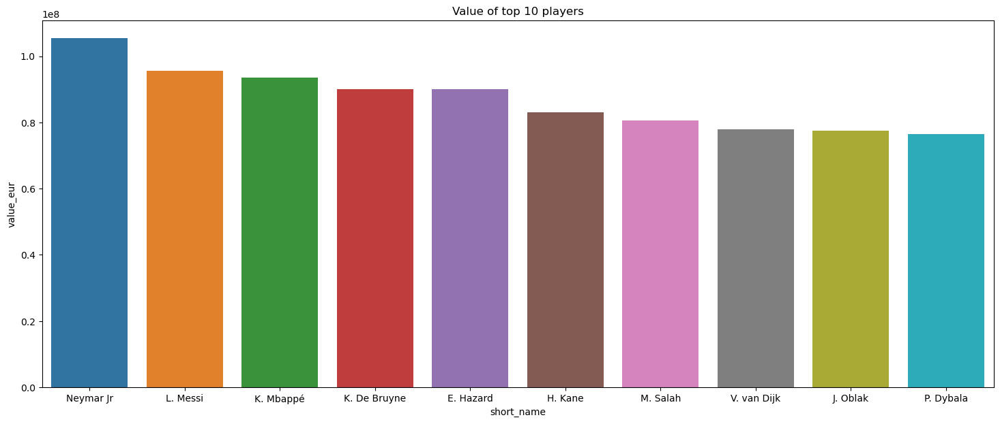

In [19]:
plt.figure(figsize=(18, 7), dpi = 100)

sns.barplot(x='short_name', y='value_eur',data=data_value_top).set_title('Value of top 10 players')
plt.show()

#### OBSERVATION:
The most valuable player is Neymar and second most valuable player is L.Messi
Most of the players have value 10 million Euros. The density graph shows it concentrated around 2-3 million Euros.

### Wage in Euro of Top 10 players

In [20]:
data_wages_top=data[['short_name', 'wage_eur']].sort_values(by='wage_eur',ascending=False).head(10).reset_index(drop=True)
data_wages_top.index+=1
data_wages_top

,short_name,wage_eur
1,L. Messi,565000
2,E. Hazard,470000
3,Cristiano Ronaldo,405000
4,K. De Bruyne,370000
5,A. Griezmann,370000
6,L. Suárez,355000
7,L. Modrić,340000
8,T. Kroos,330000
9,S. Agüero,300000
10,Sergio Busquets,300000


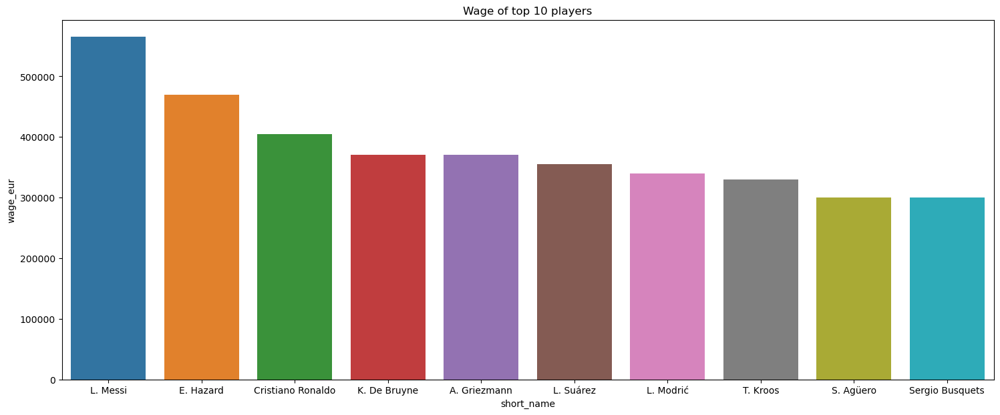

In [21]:
plt.figure(figsize=(18, 7), dpi = 100)

sns.barplot(x='short_name', y='wage_eur', data=data_wages_top).set_title('Wage of top 10 players')
plt.show()

#### OBSERVATION:
The most salaried player is L. Messi

### Peferred Foot of Most Players`

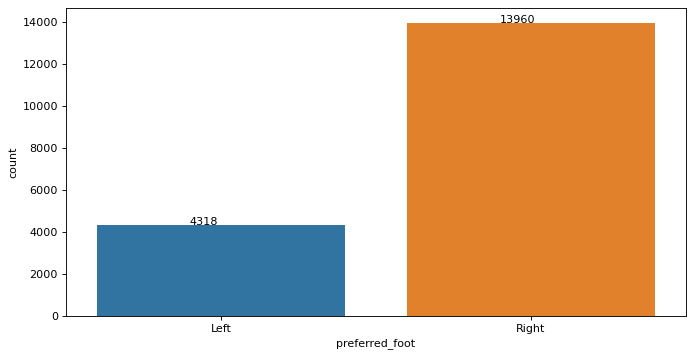

In [22]:
plt.figure(figsize=(10,5), dpi = 80)

ax=sns.countplot(x = data['preferred_foot'])
for p in ax.patches:
    ax.annotate('{:1.0f}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()+0.01))
plt.show()

#### Observation:
Most players like to use their Right Foot compared to Left Foot during the game

### International Reputation of the Players

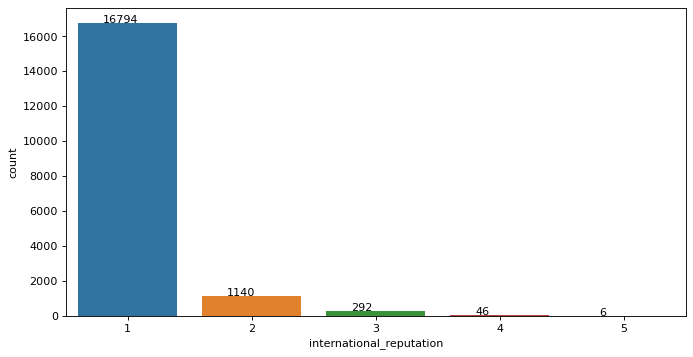

In [23]:
plt.figure(figsize=(10,5), dpi = 80)

ax=sns.countplot(x = data['international_reputation'])
for p in ax.patches:
    ax.annotate('{:1.0f}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()+0.01))
plt.show()

### Top 6 International Reputated Players

In [24]:
data[['short_name','international_reputation']].sort_values('international_reputation',ascending=False).head(6).reset_index(drop=True)

,short_name,international_reputation
0,L. Messi,5
1,L. Suárez,5
2,Z. Ibrahimović,5
3,Cristiano Ronaldo,5
4,M. Neuer,5
5,Neymar Jr,5


#### OBSERVATION:
Top 6 International reputated players are:
L. Messi, L. Suárez, Z. Ibrahimović, Cristiano Ronaldo, M. Neuer, Neymar Jr

### Weak Foot and Skill Moves

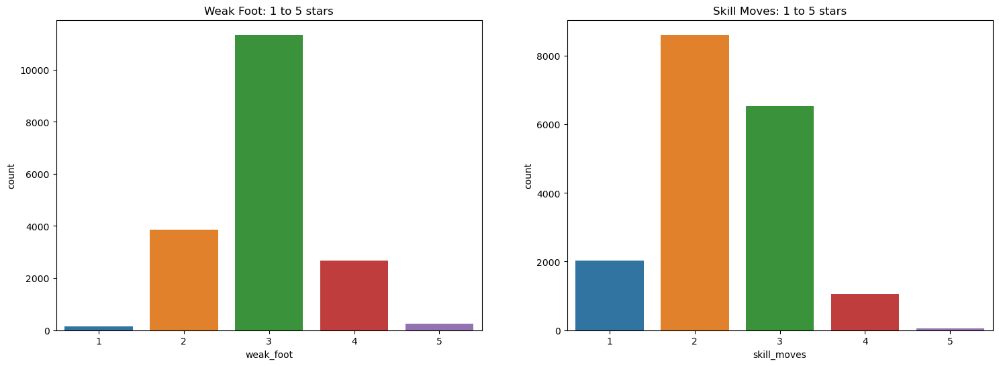

In [25]:
fig, ax = plt.subplots(1,2, figsize=(18, 6),dpi=100)

sns.countplot(x='weak_foot', data=data, ax=ax[0]).set(title='Weak Foot: 1 to 5 stars')
sns.countplot(x='skill_moves', data=data, ax=ax[1]).set(title='Skill Moves: 1 to 5 stars')
plt.show()

In [26]:
data['weak_foot'].value_counts()

3    11347
2     3865
4     2666
5      245
1      155
Name: weak_foot, dtype: int64

#### OBSERVATION:
> Most of the players are rated 3 Stars in Weak Foot Ratings. There are only 245 players have 5 star Weak Foot ratings.

> In Skill Moves Rating, most of the players fall in 2nd and 3rd Stars (close to 80%). Only 49 players have 5 Star skill moves ratings.

### Work Rate of the Players

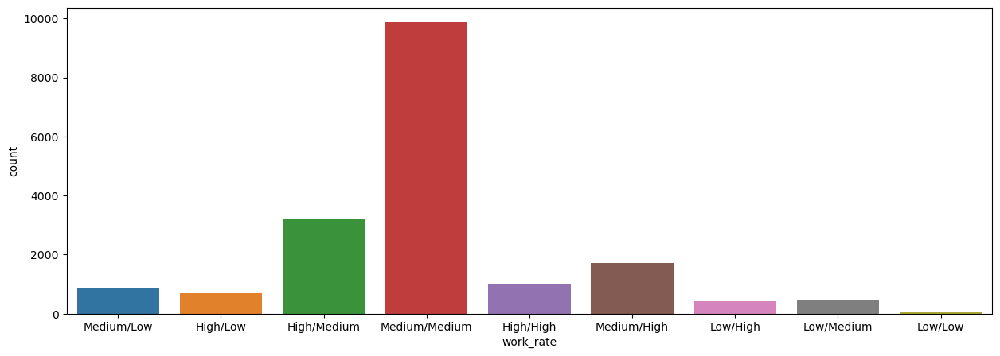

In [27]:
plt.figure(figsize=(15,5), dpi = 100)

sns.countplot(x = data['work_rate'])
plt.show()

#### OBSERVATION:
Most of the players uses Medium attack and defence work rate.

### Team Position

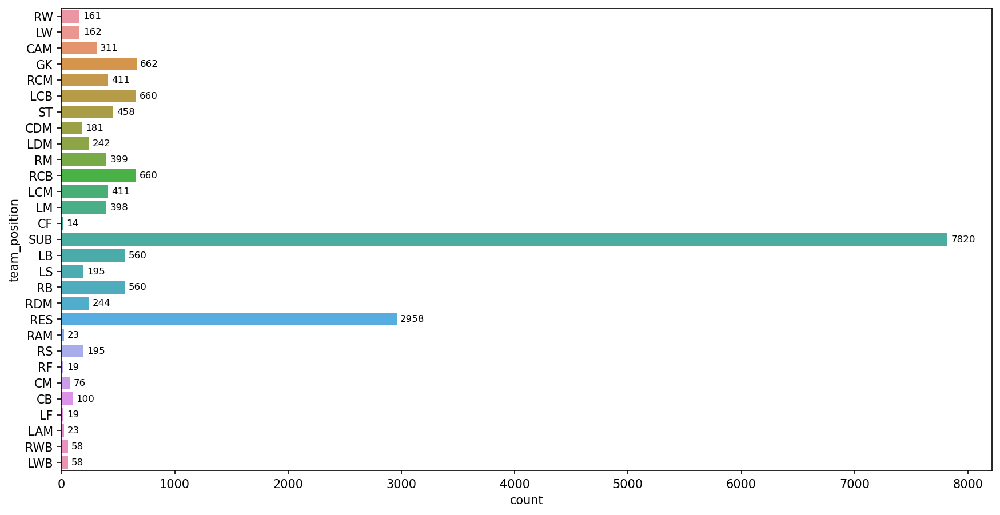

In [28]:
plt.figure(figsize=(14, 7), dpi = 150)

ax = sns.countplot(y='team_position', data=data)
for bars_group in ax.containers:
    ax.bar_label(bars_group, padding=3, fontsize=8)

#### OBSERVATION:
    
Most of the players are Substitutes(SUB), their number is 7820. 
Then there are Reserved 2958 players (RES)

There are 662 Goalkeepers in the Dataset.

Number of Attackers
>RW(161), LW(162), ST(458), RS(195), LS(195), CF(14), RF(19), LF(19) are all attackers and They are 1,223 in Total

Number of Midfielders
>CAM(311), RCM(411), CDM(181), LDM(242), RM(399), LM(398), LCM(411), RDM(244), RAM(23), CM(76), LAM(23), are all midfielders. They are 2,719 in Total

Number of Defenders
>LCB(660), RCB(660), LB(560), RB(560), CB(100), RWB(58), LWB(58) are all Midfielders and their total Number is 2,656

### Skills of the Players

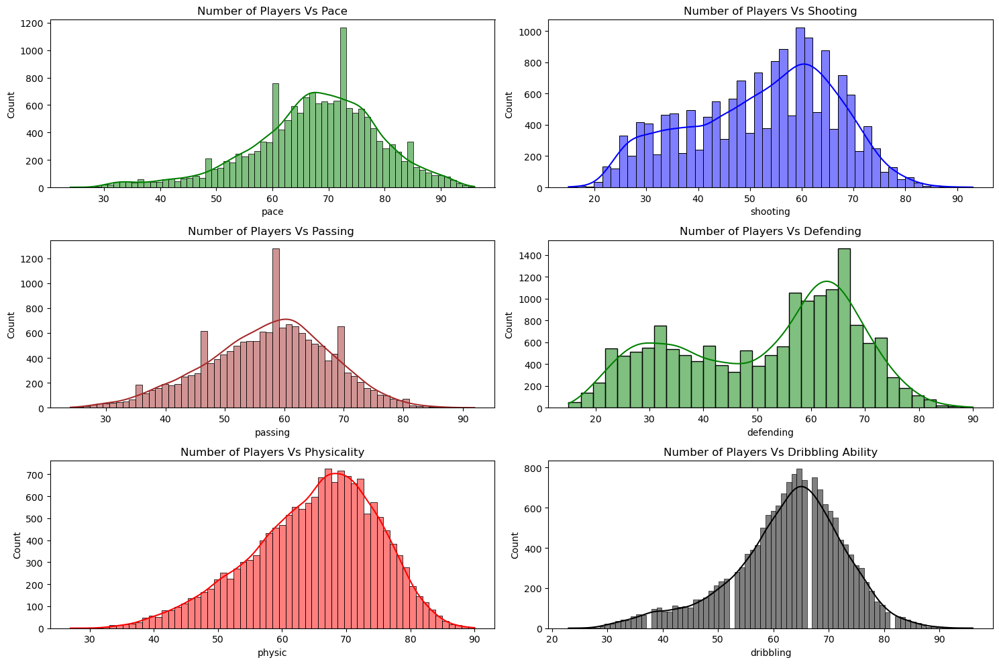

In [29]:
fig,axs = plt.subplots(3,2, figsize = (15,10), dpi=100)

sns.histplot(data=data, x="pace", kde=True, color="green", ax=axs[0, 0]).set(title="Number of Players Vs Pace")
sns.histplot(data=data, x="shooting", kde=True, color="blue", ax=axs[0, 1]).set(title="Number of Players Vs Shooting")
sns.histplot(data=data, x="passing", kde=True, color="brown", ax=axs[1, 0]).set(title="Number of Players Vs Passing ")
sns.histplot(data=data, x="defending", kde=True, color="green", ax=axs[1, 1]).set(title="Number of Players Vs Defending")
sns.histplot(data=data, x="physic", kde=True, color="red", ax=axs[2, 0]).set(title="Number of Players Vs Physicality")
sns.histplot(data=data, x="dribbling", kde=True, color="black", ax=axs[2, 1]).set(title="Number of Players Vs Dribbling Ability")
fig.tight_layout()

- Number of Players Vs Pace
>Most of the players fall wthin 65 to 75 pace ratings. Number of players decline after 75.

- Number of Players Vs Shooting Ability
>Most of the players fall within 55 to 65 Shooting ability. There is steep decline in numbers after 65. A few players have been given shooting ability ratings above 80.

- Number of Players Vs Passing Ability
>Most of the players have passing ability of 60. 

- Number of Players Vs Defending Ability
> After the steady rise from 20 to 30, there seems to be decline in upto 55 and again after 55, there is steep rise. Most of the players fall between 55 to 75 ratings.

- Number of Players Vs Physicality (Strength and Stamina)
> Most of the players have physicality of around 70. With the steady rise in the count from 40 to 70, it falls steeply after 70. Their are veru less players with  physical ability of more than 85. 

- Number of Players Vs Dribbling ability
> Most of the players have Dribbling ability between 60 and 70 as shown in the graph.


### Attacking Skills of the Players

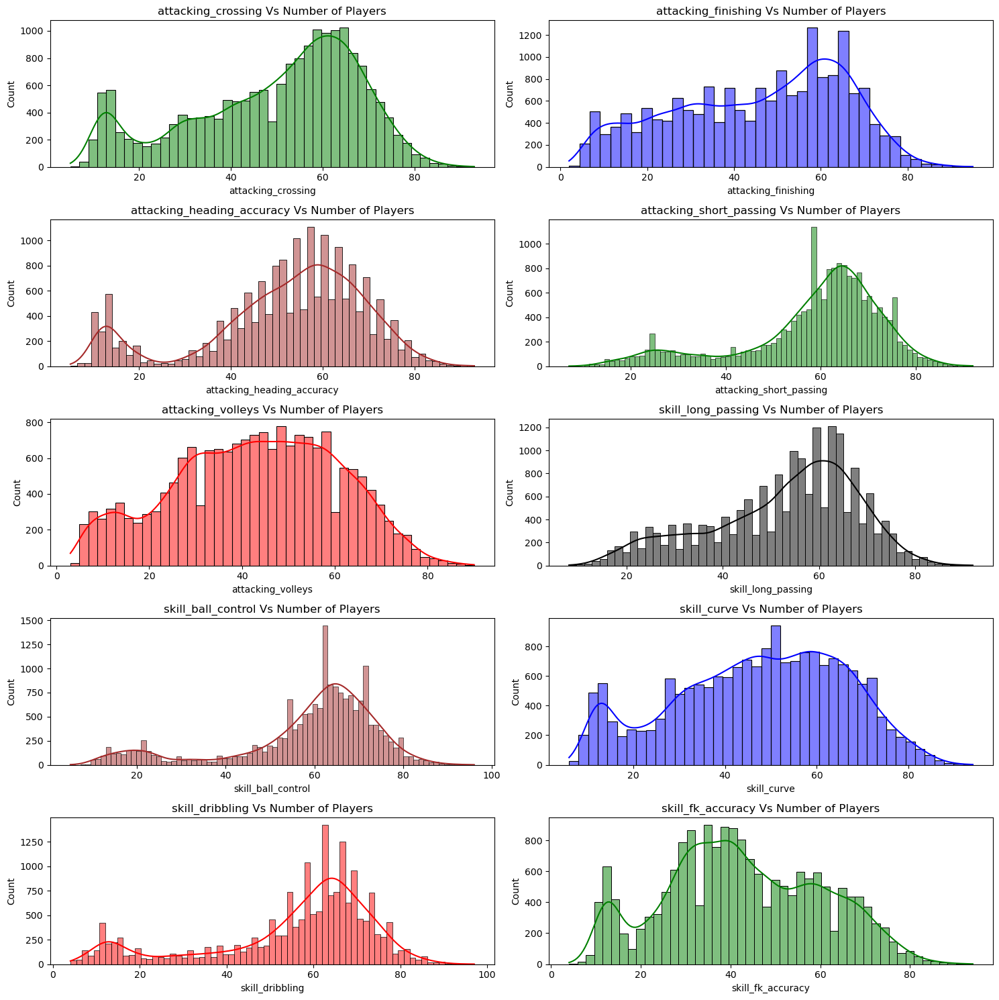

In [30]:
fig,axs = plt.subplots(5,2, figsize = (15,15), dpi=100)

sns.histplot(data=data, x="attacking_crossing", kde=True, color="green",ax=axs[0, 0]).set(title="attacking_crossing Vs Number of Players")
sns.histplot(data=data, x="attacking_finishing", kde=True, color="blue",ax=axs[0, 1]).set(title="attacking_finishing Vs Number of Players")
sns.histplot(data=data, x="attacking_heading_accuracy", kde=True, color="brown",ax=axs[1, 0]).set(title="attacking_heading_accuracy Vs Number of Players")
sns.histplot(data=data, x="attacking_short_passing", kde=True, color="green",ax=axs[1, 1]).set(title="attacking_short_passing Vs Number of Players")
sns.histplot(data=data, x="attacking_volleys", kde=True, color="red",ax=axs[2, 0]).set(title="attacking_volleys Vs Number of Players")
sns.histplot(data=data, x="skill_long_passing", kde=True, color="black",ax=axs[2, 1]).set(title="skill_long_passing Vs Number of Players")
sns.histplot(data=data, x="skill_ball_control", kde=True, color="brown",ax=axs[3, 0]).set(title="skill_ball_control Vs Number of Players")
sns.histplot(data=data, x="skill_curve", kde=True, color="blue",ax=axs[3, 1]).set(title="skill_curve Vs Number of Players")
sns.histplot(data=data, x="skill_dribbling", kde=True, color="red",ax=axs[4, 0]).set(title="skill_dribbling Vs Number of Players")
sns.histplot(data=data, x="skill_fk_accuracy", kde=True, color="green",ax=axs[4, 1]).set(title="skill_fk_accuracy Vs Number of Players")
plt.tight_layout()

### Movement Skills of the Players

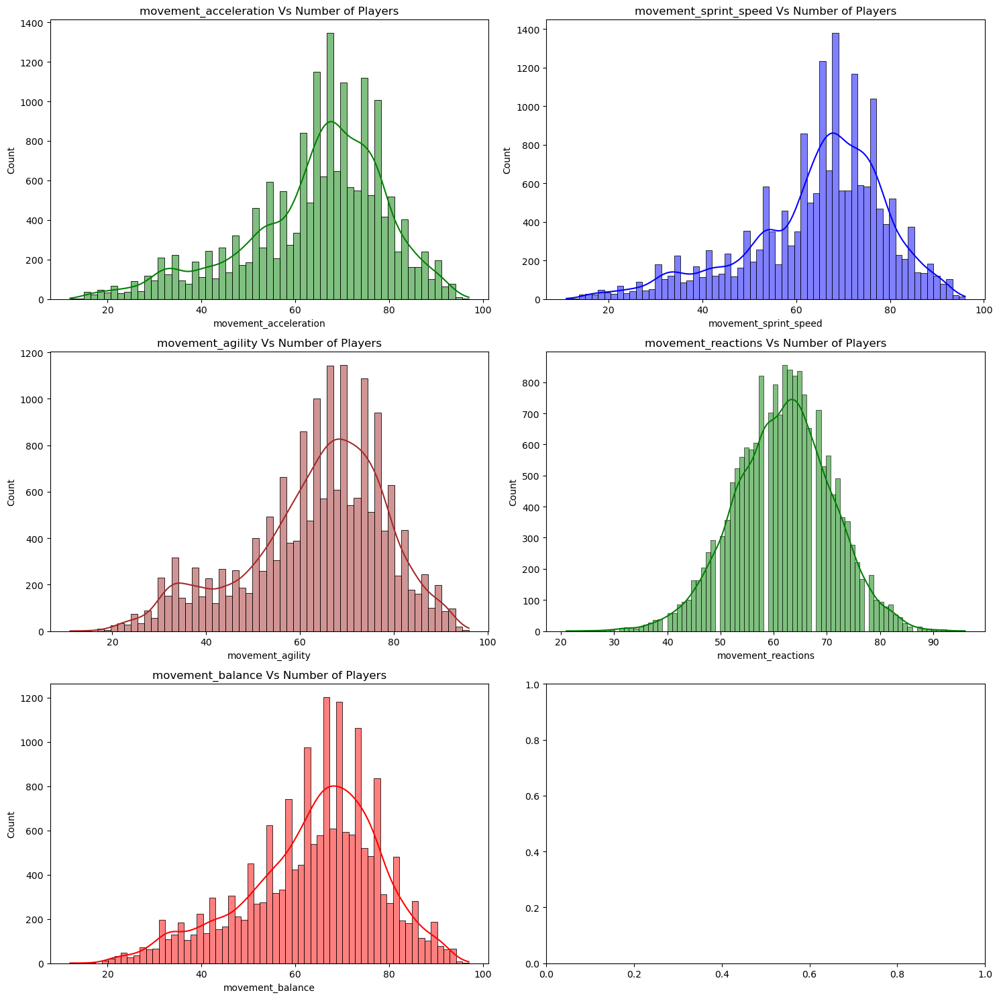

In [31]:
fig,axs = plt.subplots(3,2, figsize = (15,15), dpi=100)

sns.histplot(data=data, x="movement_acceleration", kde=True, color="green",ax=axs[0, 0]).set(title="movement_acceleration Vs Number of Players")
sns.histplot(data=data, x="movement_sprint_speed", kde=True, color="blue",ax=axs[0, 1]).set(title="movement_sprint_speed Vs Number of Players")
sns.histplot(data=data, x="movement_agility", kde=True, color="brown",ax=axs[1, 0]).set(title="movement_agility Vs Number of Players")
sns.histplot(data=data, x="movement_reactions", kde=True, color="green",ax=axs[1, 1]).set(title="movement_reactions Vs Number of Players")
sns.histplot(data=data, x="movement_balance", kde=True, color="red",ax=axs[2, 0]).set(title="movement_balance Vs Number of Players")
plt.tight_layout()

### Power Skills of the Players

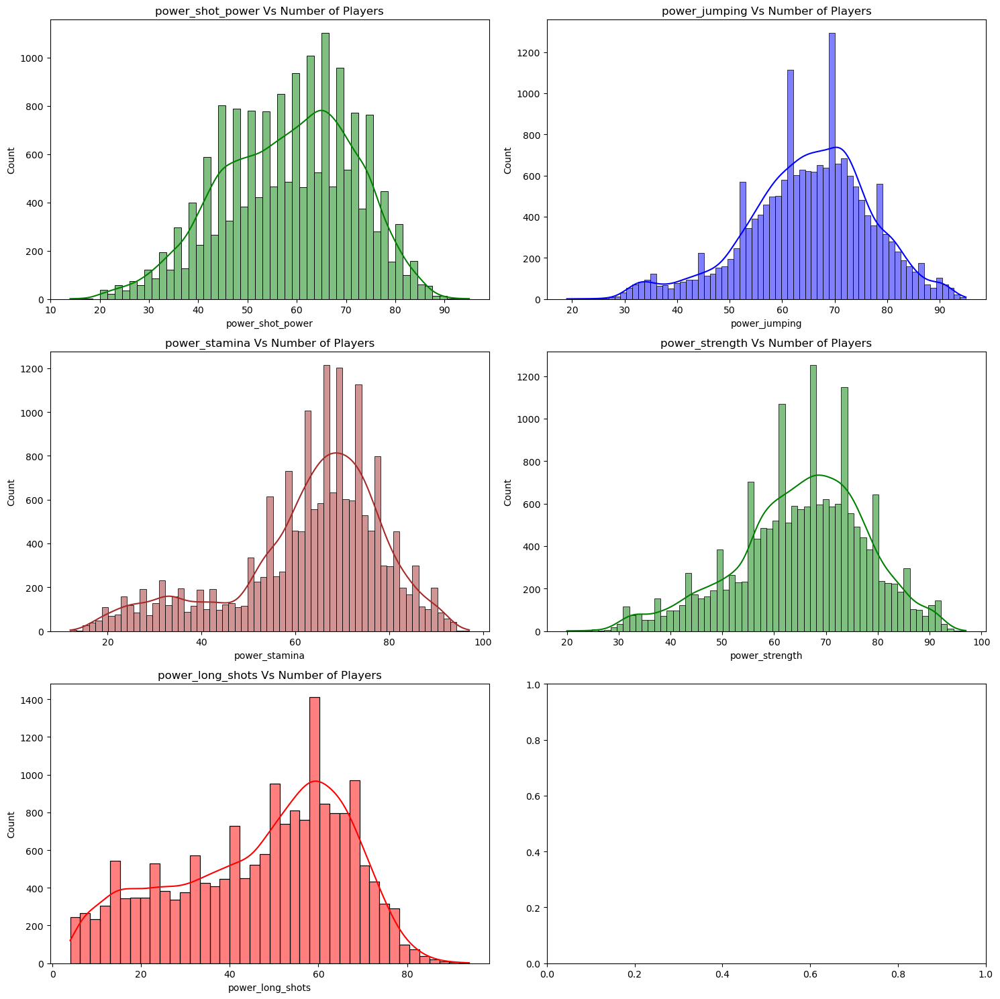

In [32]:
fig,axs = plt.subplots(3,2, figsize = (15,15), dpi=100)

sns.histplot(data=data, x="power_shot_power", kde=True, color="green",ax=axs[0, 0]).set(title="power_shot_power Vs Number of Players")
sns.histplot(data=data, x="power_jumping", kde=True, color="blue",ax=axs[0, 1]).set(title="power_jumping Vs Number of Players")
sns.histplot(data=data, x="power_stamina", kde=True, color="brown",ax=axs[1, 0]).set(title="power_stamina Vs Number of Players")
sns.histplot(data=data, x="power_strength", kde=True, color="green",ax=axs[1, 1]).set(title="power_strength Vs Number of Players")
sns.histplot(data=data, x="power_long_shots", kde=True, color="red",ax=axs[2, 0]).set(title="power_long_shots Vs Number of Players")
plt.tight_layout()

### Mentality Skills of the Players

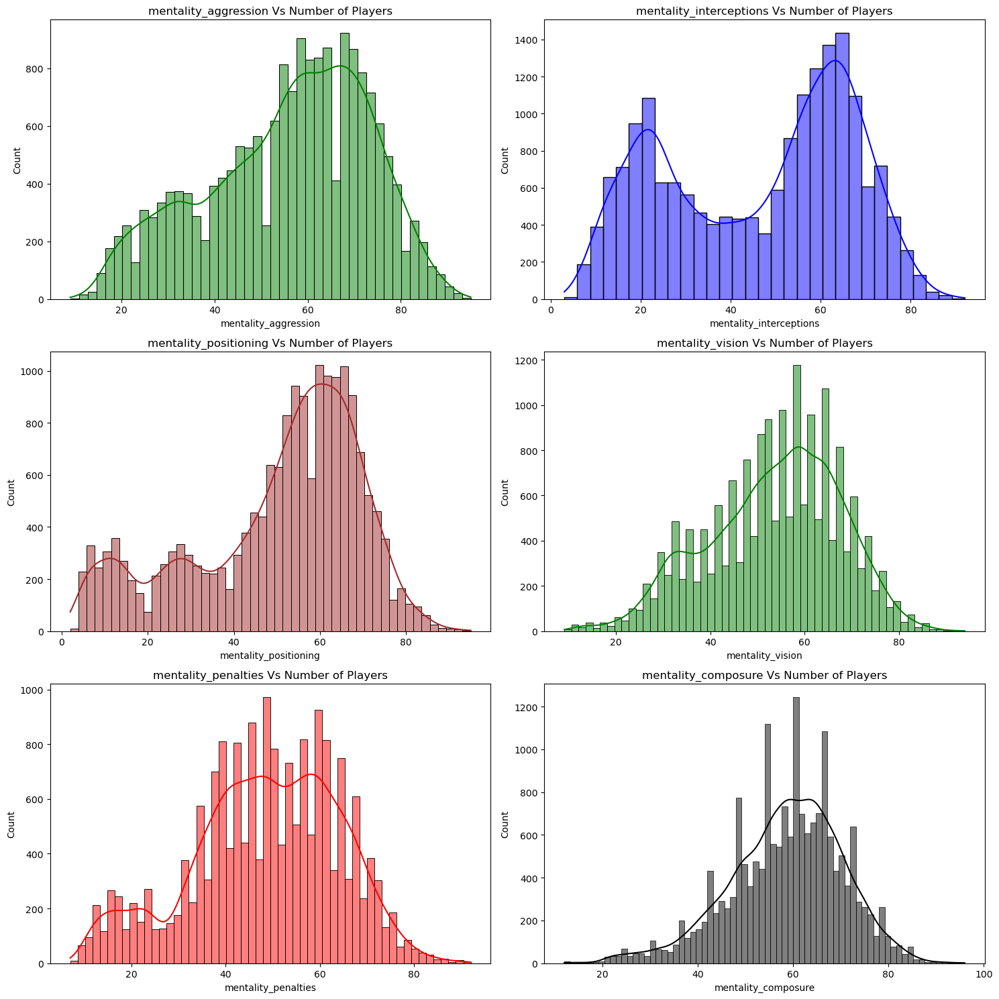

In [33]:
fig,axs = plt.subplots(3,2, figsize = (15,15), dpi=100)

sns.histplot(data=data, x="mentality_aggression", kde=True, color="green",ax=axs[0, 0]).set(title="mentality_aggression Vs Number of Players")
sns.histplot(data=data, x="mentality_interceptions", kde=True, color="blue",ax=axs[0, 1]).set(title="mentality_interceptions Vs Number of Players")
sns.histplot(data=data, x="mentality_positioning", kde=True, color="brown",ax=axs[1, 0]).set(title="mentality_positioning Vs Number of Players")
sns.histplot(data=data, x="mentality_vision", kde=True, color="green",ax=axs[1, 1]).set(title="mentality_vision Vs Number of Players")
sns.histplot(data=data, x="mentality_penalties", kde=True, color="red",ax=axs[2, 0]).set(title="mentality_penalties Vs Number of Players")
sns.histplot(data=data, x="mentality_composure", kde=True, color="black",ax=axs[2, 1]).set(title="mentality_composure Vs Number of Players")
plt.tight_layout()

### Defending Skills of the Players

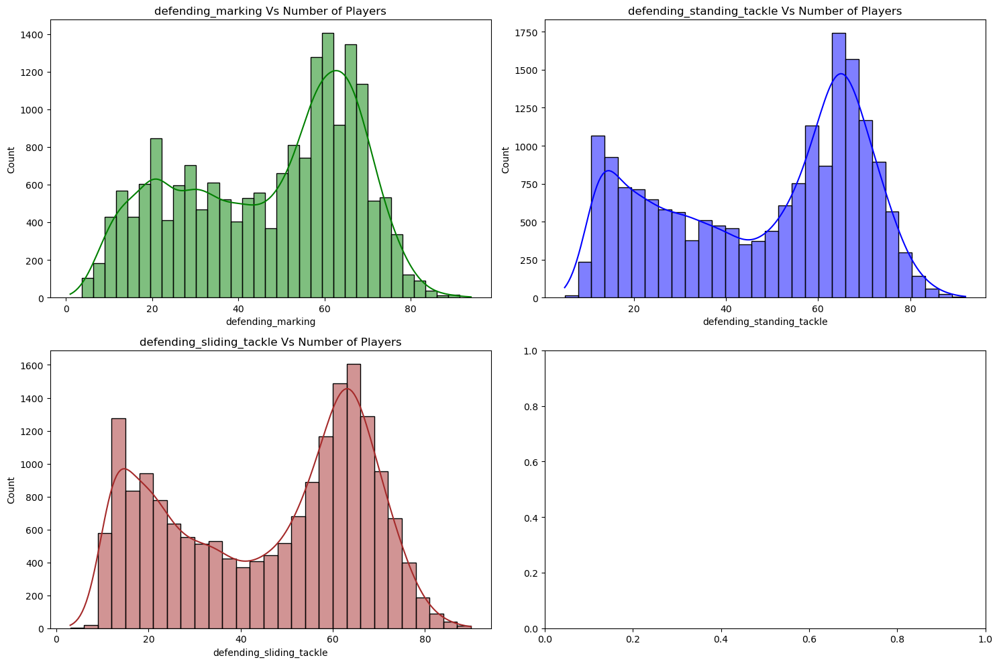

In [34]:
fig,axs = plt.subplots(2,2, figsize = (15,10), dpi=100)

sns.histplot(data=data, x="defending_marking", kde=True, color="green",ax=axs[0, 0]).set(title="defending_marking Vs Number of Players")
sns.histplot(data=data, x="defending_standing_tackle", kde=True, color="blue",ax=axs[0, 1]).set(title="defending_standing_tackle Vs Number of Players")
sns.histplot(data=data, x="defending_sliding_tackle", kde=True, color="brown",ax=axs[1, 0]).set(title="defending_sliding_tackle Vs Number of Players")
plt.tight_layout()

## Bivariate Analysis

### Age v/s Overall Rating and Potential

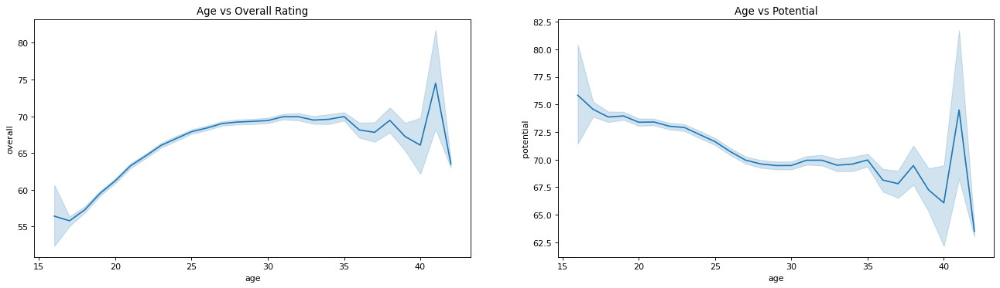

In [35]:
fig, ax = plt.subplots(1,2, figsize=(20,5), dpi = 80)

sns.lineplot('age','overall',data=data,  ax=ax[0]).set(title='Age vs Overall Rating')
sns.lineplot('age', 'potential', data=data, ax=ax[1]).set(title='Age vs Potential')
plt.show()

#### OBSERVATION:

> With increase in Age their is steady rise in Overall Ratings till the age 30. From 30 to 35, it remains nearly constant and thein starts to decline after 35. The Peak above that is shown in the graph is beacuse there are only 4 players aged 41 who have higher ratings.

> With increase in age, the potential seems to be decreasing mildly upto age 35. After age 35, is decreases significantlty. The exception at 41 is beacuse there are only 4 players, out of whom 2 players have above 90 Potential.

### Age v/s Value in Euro and Wage in Euro of players

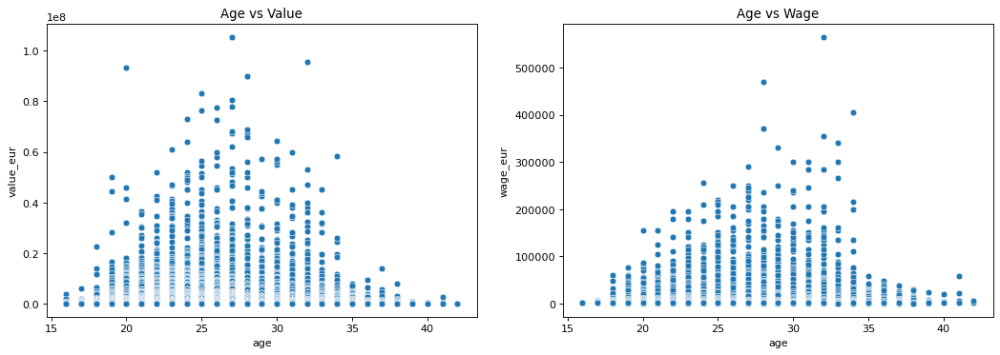

In [36]:
fig, ax = plt.subplots(1,2, figsize=(16,5), dpi = 80)

sns.scatterplot('age','value_eur',data=data,  ax=ax[0]).set(title='Age vs Value')
sns.scatterplot('age', 'wage_eur', data=data, ax=ax[1]).set(title='Age vs Wage')
plt.show()

#### Observation: 
1. The players with age 20 to 34 years has higher value compared to the youngest and higher age players
2. The players with age 20 to 34 years has higher wage in euro compared to the youngest and higher age players

### Value in Euro of players v/s Overall Rating

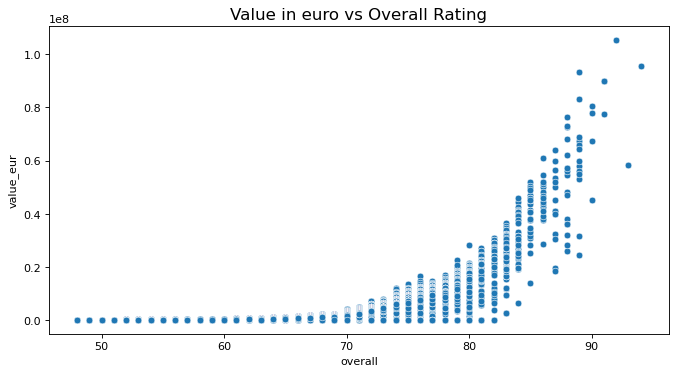

In [37]:
plt.figure(figsize=(10,5), dpi = 80)

sns.scatterplot(x='overall',y='value_eur',data=data)
plt.title('Value in euro vs Overall Rating',fontsize=15)
plt.show()

#### Observation: 
The players value in euro increases with their overall rating.

#### Observation: 
Players with High Reputation are highly Valuable.

### Value in Euro v/s Potential of players

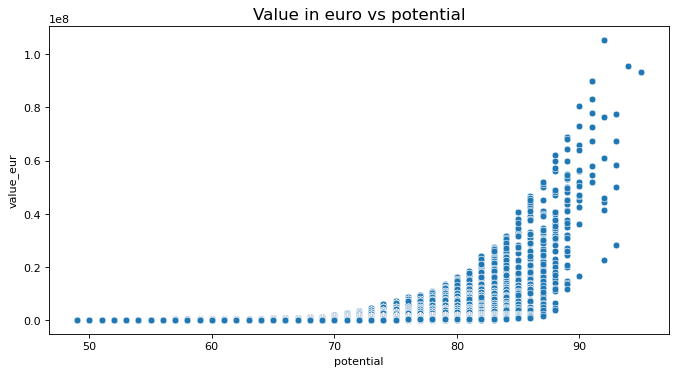

In [38]:
plt.figure(figsize=(10,5), dpi = 80)

sns.scatterplot(x='potential',y='value_eur',data=data)
plt.title('Value in euro vs potential',fontsize=15)
plt.show()

#### Observation: 
Players with High potential are highly Valuable.

In [39]:
int_rep= pd.DataFrame(data['value_eur'].groupby([data['international_reputation']]).mean().sort_values(ascending=False).head(10))
int_rep.rename(columns={"value_eur":"Avg_Value_Eur"}, inplace=True)
int_rep= int_rep.reset_index()

In [40]:
int_rep

,international_reputation,Avg_Value_Eur
0,5,5.975000e+07
1,4,3.553913e+07
2,3,2.137428e+07
3,2,8.571044e+06
4,1,1.631396e+06


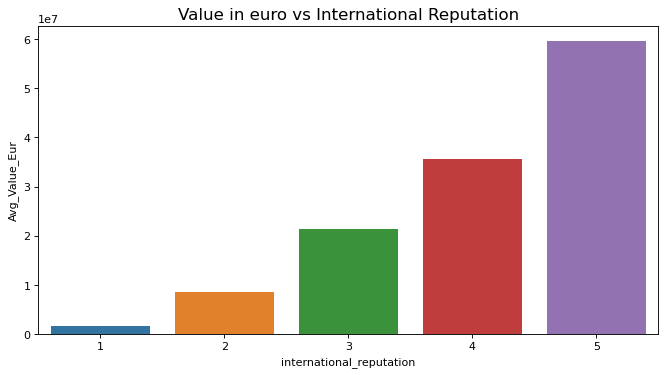

In [41]:
plt.figure(figsize=(10,5), dpi = 80)

sns.barplot(x='international_reputation',y='Avg_Value_Eur',data=int_rep)
plt.title('Value in euro vs International Reputation',fontsize=15)
plt.show()

### Observation:

> Players with highest International Reputation have highest average Value. The value(in Euros) rises with rise in International Reputation Ratings.

### Top 10 Clubs with Highest Wage paid

In [42]:
clubs_wage_eur= pd.DataFrame(data['wage_eur'].groupby([data['club']]).sum().sort_values(ascending=False).head(10))
clubs_wage_eur.rename(columns={"wage_eur":"Total_wage"}, inplace=True)

In [43]:
clubs_wage_eur.reset_index(inplace=True)
clubs_wage_eur

,club,Total_wage
0,Real Madrid,5354000
1,FC Barcelona,4950000
2,Manchester City,3984000
3,Juventus,3750000
4,Manchester United,2874000
5,Chelsea,2806000
6,Liverpool,2667000
7,Tottenham Hotspur,2603000
8,FC Bayern München,2516000
9,Paris Saint-Germain,2396000


Text(0.5, 1.0, 'Top 10 Clubs with highest spendings on Wages')

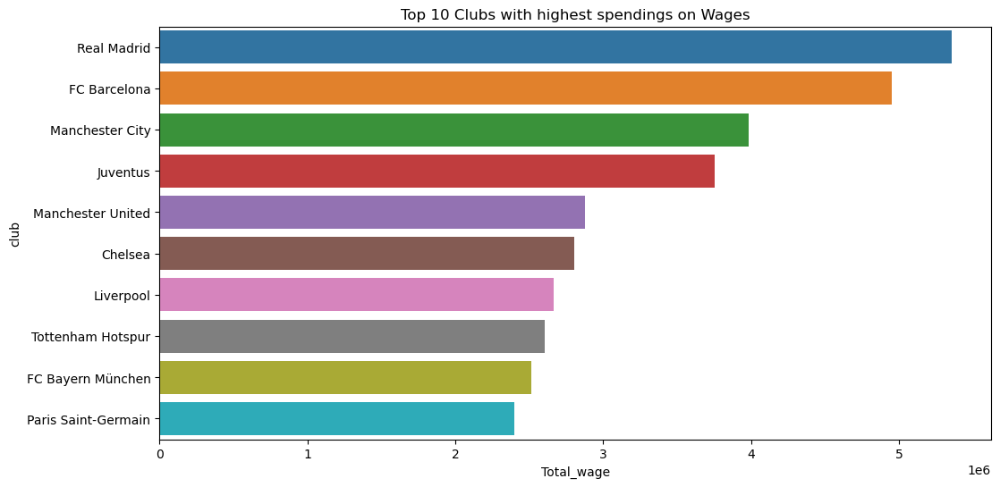

In [44]:
plt.figure(figsize=(12,6))
sns.barplot(y='club', x='Total_wage', data=clubs_wage_eur).set_title('Top 10 Clubs with highest spendings on Wages')

**Observation**

Real Madrid Spends Highest amount on Wages of the players. FC Barcelona and Manchester City come at second and third place respectively.

### Top 10 Clubs with Overall Rating Average

In [45]:
clubs_avg_overall= pd.DataFrame(data['overall'].groupby([data['club']]).mean().sort_values(ascending=False).head(10))
clubs_avg_overall.rename(columns={'overall':'overall_avg'}, inplace=True)

In [46]:
clubs_avg_overall.reset_index(inplace=True)
clubs_avg_overall

,club,overall_avg
0,FC Bayern München,81.304348
1,Real Madrid,80.121212
2,Juventus,80.060606
3,Uruguay,78.608696
4,FC Barcelona,78.363636
5,Mexico,78.000000
6,Netherlands,78.000000
7,Colombia,78.000000
8,Bayer 04 Leverkusen,77.280000
9,Chelsea,77.060606


Text(0.5, 1.0, 'Top 10 Clubs with highest average Overall Raitings')

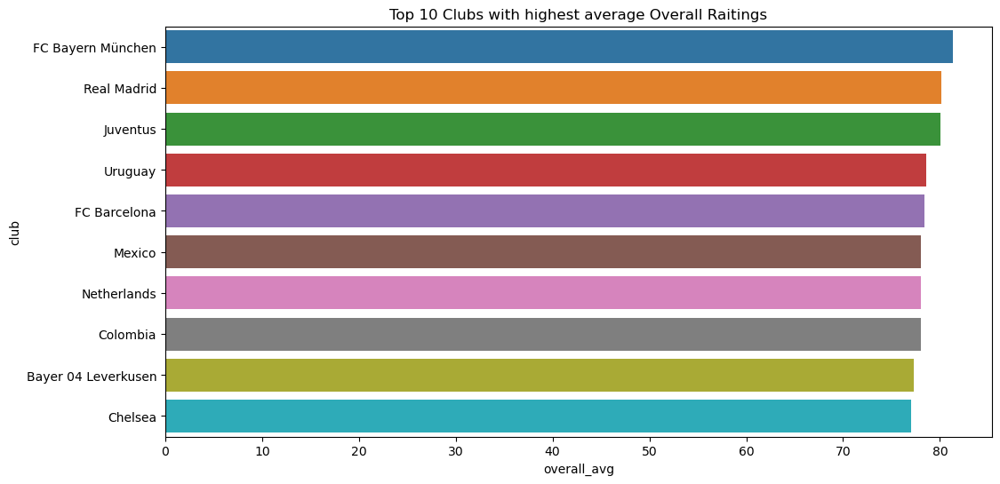

In [47]:
plt.figure(figsize=(12,6))
sns.barplot(y='club', x='overall_avg', data=clubs_avg_overall).set_title('Top 10 Clubs with highest average Overall Raitings')

**Observation**

- FC Bayern Munchen has the highest overall average Rating of 81.3

### Effect of Age, Height and Weight on the Pace Rating of Players

[Text(0.5, 1.0, 'Weight(kg) Vs Pace')]

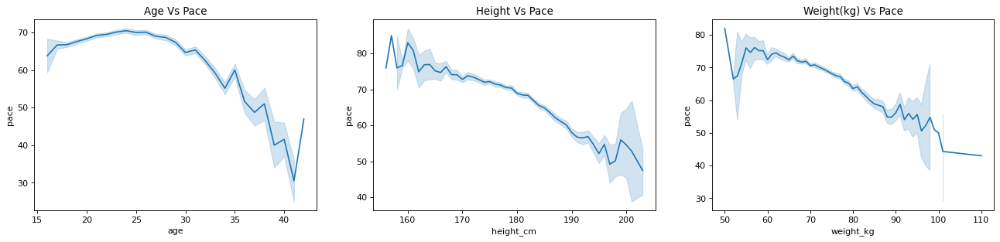

In [48]:
fig, ax = plt.subplots(1,3, figsize=(20, 4), dpi=80)

sns.lineplot(x="age", y='pace', data=data, ax=ax[0]).set(title='Age Vs Pace')
sns.lineplot(x="height_cm", y='pace',data=data, ax=ax[1]).set(title='Height Vs Pace')
sns.lineplot(x="weight_kg", y='pace', data=data, ax=ax[2]).set(title='Weight(kg) Vs Pace')

#### OBSERVATION:

> With increasing Age, Pace shows steep decline in Pace of player 

> Tall players seems to have low pace ratings as compared to short players. With increase in height, pace rating is decreasing.

> Like height, heigher Weight is also affecting pace negatively 

### Effect of Age on Acceleration, Agility and Sprint Speed of the Player.

[Text(0.5, 1.0, 'Age Vs Sprint Speed')]

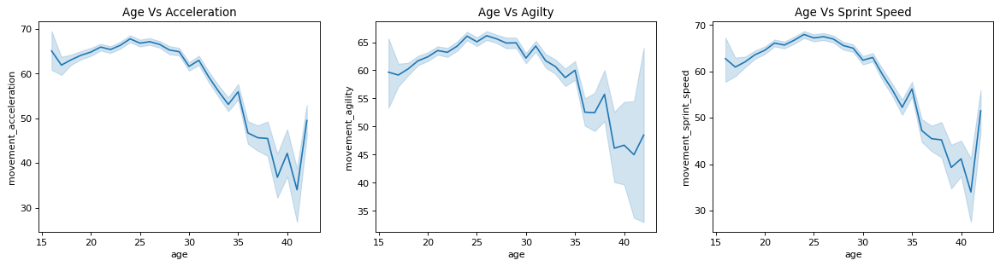

In [49]:
fig, ax = plt.subplots(1,3, figsize=(18, 4), dpi=80)

sns.lineplot(x="age", y='movement_acceleration', data=data, ax=ax[0]).set(title='Age Vs Acceleration')
sns.lineplot(x="age", y='movement_agility', data=data, ax=ax[1]).set(title='Age Vs Agilty')
sns.lineplot(x="age", y='movement_sprint_speed', data=data, ax=ax[2]).set(title='Age Vs Sprint Speed')

#### OBSERVATION:
With the increases in age, Acceleration, Agility and Sprint speed shows a Negative correlation. There is exception at 41 years of age because of the data of only 4 players, which can be neglected.

### Type of Offensive Players ( Striker, Right-Winger and Left-Winger) tends to get paid the most 

In [50]:
# Seperating the Data of Strikers (ST), the Right Wingers(RW) and Left Wingers (LW)

RW=data[data["team_position"] == 'RW']
LW=data[data["team_position"] == 'LW']
ST=data[data["team_position"] == 'ST']

Offensive_list=[RW,ST,LW]  
OP_1=pd.concat(Offensive_list).reset_index(drop=True)  

OP_2= OP_1[['short_name','team_position', 'wage_eur']].sort_values(by='wage_eur', ascending=False).reset_index(drop=True)
OP=OP_2.groupby(by='team_position', as_index=False)

print (OP.count())
print (OP.sum())

  team_position  short_name  wage_eur
0            LW         162       162
1            RW         161       161
2            ST         458       458
  team_position  wage_eur
0            LW   3776000
1            RW   3385000
2            ST   7535000


  team_position  Average Wage
1            LW  23308.641975
2            RW  21024.844720
3            ST  16451.965066


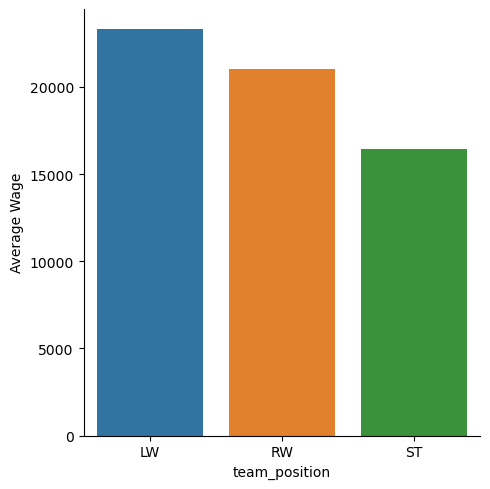

In [51]:
#Average Wage of Offensive Players according to their Postion

Avg_Wage_OP =pd.DataFrame(OP.mean())
Avg_Wage_OP.rename(columns = {"wage_eur":"Average Wage"},  inplace=True)
Avg_Wage_OP.index+=1
print(Avg_Wage_OP)

# Displaying barplot of the players with their average wage

sns.catplot(data=Avg_Wage_OP, x="team_position", y="Average Wage", kind="bar")
plt.show()

#### OBSERVATION:
> Out of Three types of Offensive Players, Left Wingers are paid the Most with average earning of 23,308 Euros. 

> Right Wingers are at the 2nd place with average earning of 21,024 Euros and Strikers come at 3rd place with average earning of 16,451 Euros

### Overall Rating vs Work Rate of the Players

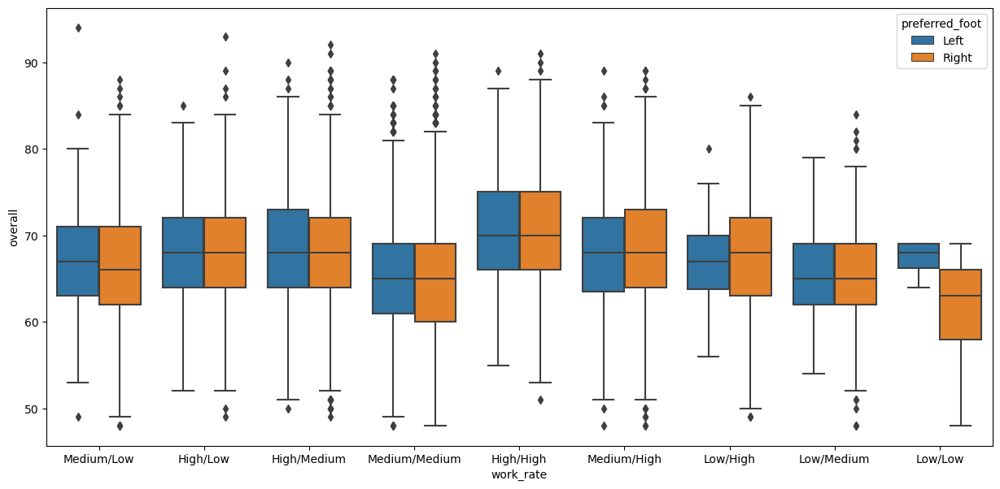

In [52]:
plt.figure(figsize=(15,7))

sns.boxplot(x='work_rate',y='overall',data=data,hue='preferred_foot')
plt.show()

#### OBSERVATION:

1. If player's attack/defence work rate is  High/High then there is no difference in player's rating, if they prefer right or left foot.

2. If player's attack/defence work rate is  High/Medium then their potential is slightly higher in casse if they prefer left foot than right foot in game.

3. If player's attact/defence work rate is Medium/High and Low/High then their potential is slightly higher in case if they prefer right foot than left foot in game.


###  Potential of the Players with skill moves vs weak foot

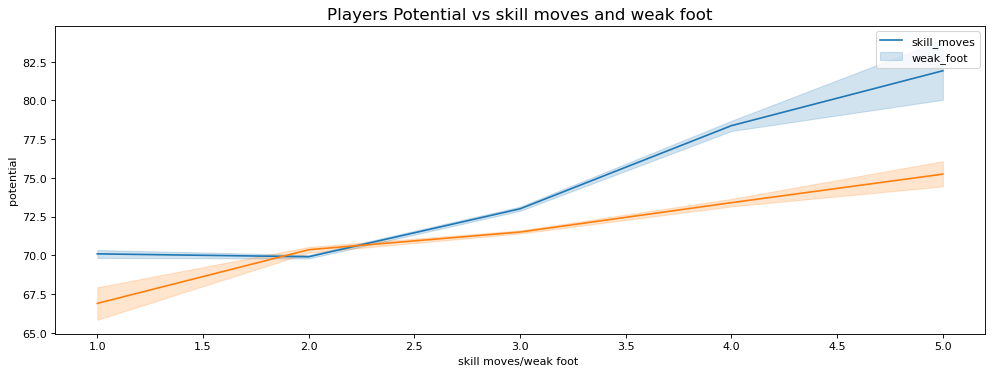

In [53]:
plt.figure(figsize = (15, 5), dpi = 80)

sns.lineplot(x='skill_moves',y='potential',data=data)
sns.lineplot(x='weak_foot',y='potential',data=data)

plt.xlabel('skill moves/weak foot ')
plt.title('Players Potential vs skill moves and weak foot',fontsize=15)
plt.legend(['skill_moves','weak_foot'])
plt.show()

#### OBSERVATION:
The players will have high potential if they improve their skill moves rather than their weak foot 

### Potential of the Players with their attacking skills

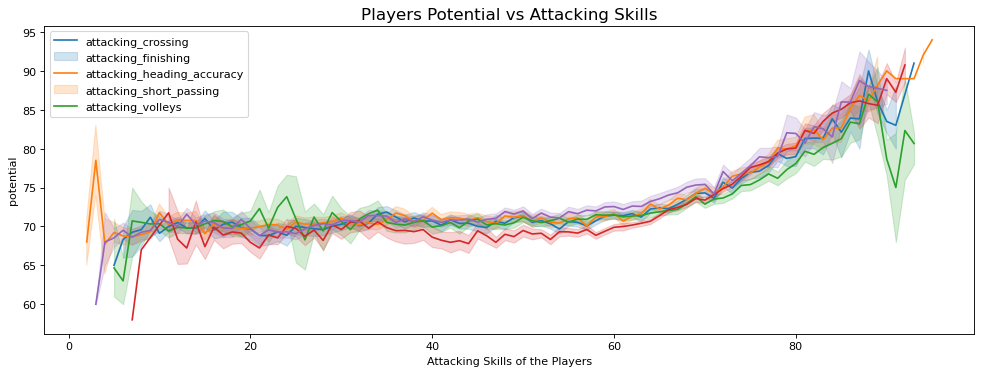

In [54]:
plt.figure(figsize = (15, 5), dpi = 80)

sns.lineplot(x='attacking_crossing',y='potential',data=data)
sns.lineplot(x='attacking_finishing',y='potential',data=data)
sns.lineplot(x='attacking_heading_accuracy',y='potential',data=data)
sns.lineplot(x='attacking_short_passing',y='potential',data=data)
sns.lineplot(x='attacking_volleys',y='potential',data=data)

plt.xlabel('Attacking Skills of the Players')
plt.title('Players Potential vs Attacking Skills',fontsize=15)
plt.legend(['attacking_crossing','attacking_finishing','attacking_heading_accuracy','attacking_short_passing','attacking_volleys'])
plt.show()

#### Observation:
1. Players have a constant potential with their attacking skills of 60 and below. 
2. Players with a potential of 70 above shows a steady increase in their attacking skills.

### Potential of the Players with their Skills with the football

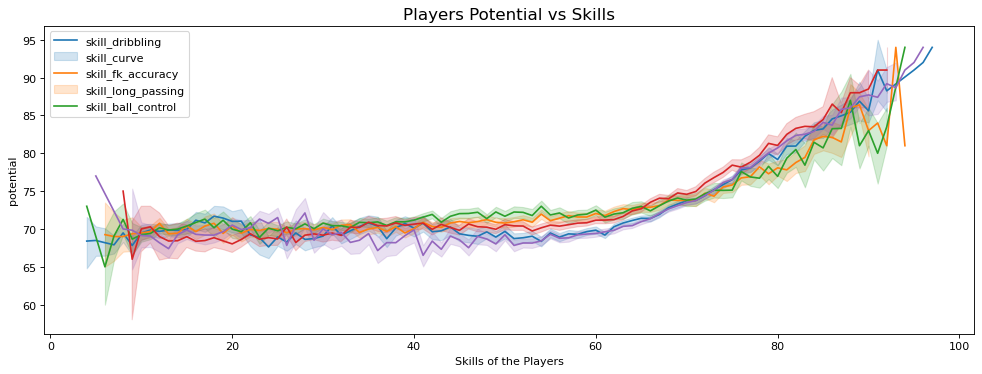

In [55]:
plt.figure(figsize = (15, 5), dpi = 80)

sns.lineplot(x='skill_dribbling',y='potential',data=data)
sns.lineplot(x='skill_curve',y='potential',data=data)
sns.lineplot(x='skill_fk_accuracy',y='potential',data=data)
sns.lineplot(x='skill_long_passing',y='potential',data=data)
sns.lineplot(x='skill_ball_control',y='potential',data=data)

plt.xlabel('Skills of the Players')
plt.title('Players Potential vs Skills',fontsize=15)
plt.legend(['skill_dribbling','skill_curve','skill_fk_accuracy','skill_long_passing','skill_ball_control'])
plt.show()

#### Observation:
1. Players have a constant potential with their skill of 60 and below. 
2. Players with a potential of 70 above shows a steady increase in their skills with the ball.

### Potential of the Players with their Movement Skills 

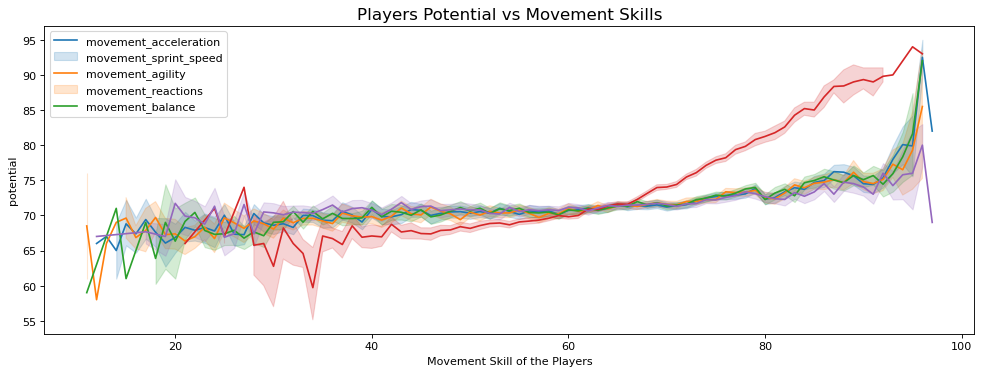

In [56]:
plt.figure(figsize = (15, 5), dpi = 80)

sns.lineplot(x='movement_acceleration',y='potential',data=data)
sns.lineplot(x='movement_sprint_speed',y='potential',data=data)
sns.lineplot(x='movement_agility',y='potential',data=data)
sns.lineplot(x='movement_reactions',y='potential',data=data)
sns.lineplot(x='movement_balance',y='potential',data=data)

plt.xlabel('Movement Skill of the Players')
plt.title('Players Potential vs Movement Skills',fontsize=15)
plt.legend(['movement_acceleration','movement_sprint_speed','movement_agility','movement_reactions','movement_balance'])
plt.show()

#### Observation:
1. Players have a constant potential with their movement skills. 
2. Players with a potential of 70 show an increase in their movement reaction as compared to their other movement skills.

### Potential of the Players with their Power Skills

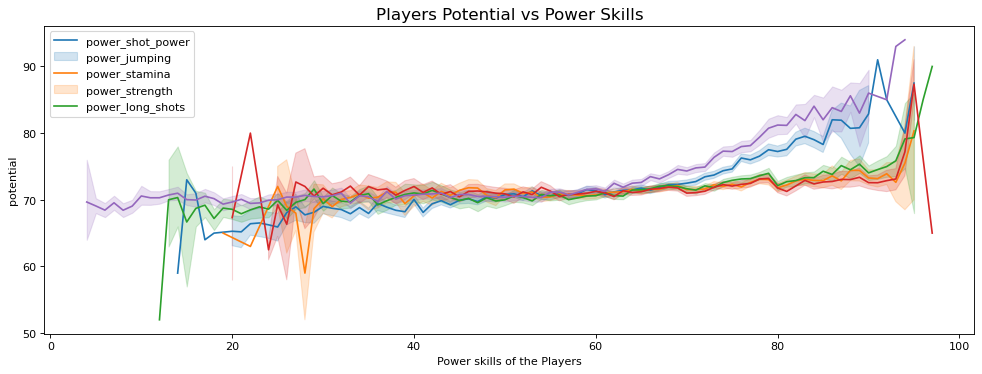

In [57]:
plt.figure(figsize = (15, 5), dpi = 80)

sns.lineplot(x='power_shot_power',y='potential',data=data)
sns.lineplot(x='power_jumping',y='potential',data=data)
sns.lineplot(x='power_stamina',y='potential',data=data)
sns.lineplot(x='power_strength',y='potential',data=data)
sns.lineplot(x='power_long_shots',y='potential',data=data)

plt.xlabel('Power skills of the Players')
plt.title('Players Potential vs Power Skills',fontsize=15)
plt.legend(['power_shot_power','power_jumping','power_stamina','power_strength','power_long_shots'])
plt.show()

#### Observation:
1. Players has a constant potential with their power skills.
2. Players with a potential of 70 above shows a steady increase in their power shot and power long shot skills compared to other power skills.

### Potential of the Players with their Mentality Skills

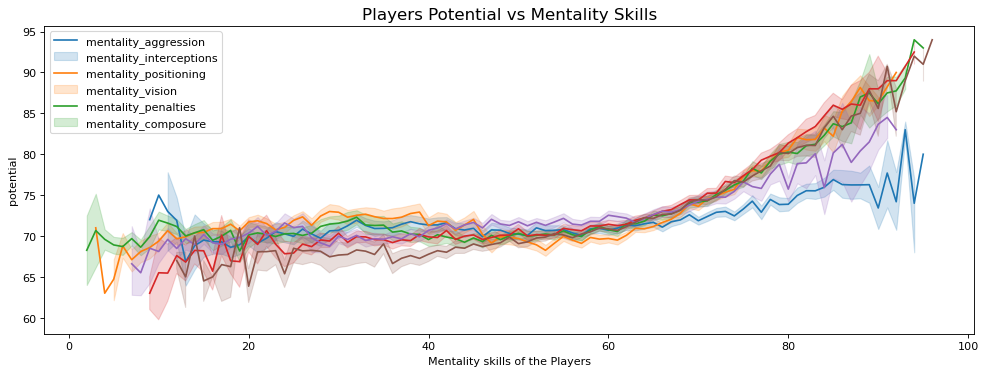

In [58]:
plt.figure(figsize = (15, 5), dpi = 80)

sns.lineplot(x='mentality_aggression',y='potential',data=data)
sns.lineplot(x='mentality_interceptions',y='potential',data=data)
sns.lineplot(x='mentality_positioning',y='potential',data=data)
sns.lineplot(x='mentality_vision',y='potential',data=data)
sns.lineplot(x='mentality_penalties',y='potential',data=data)
sns.lineplot(x='mentality_composure',y='potential',data=data)

plt.xlabel('Mentality skills of the Players')
plt.title('Players Potential vs Mentality Skills',fontsize=15)
plt.legend(['mentality_aggression','mentality_interceptions','mentality_positioning','mentality_vision','mentality_penalties','mentality_composure'])
plt.show()

#### Observation:
1. Players has a constant potential with their skill of 60 and below. 
2. Players with a potential of 60 above shows a steady increase in their mentality skills.

### Potential of the Players with their Defending Skills

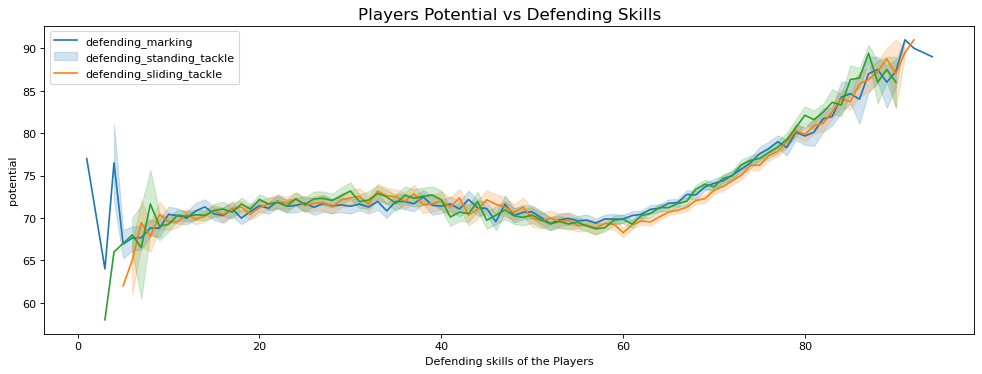

In [59]:
plt.figure(figsize = (15, 5), dpi = 80)

sns.lineplot(x='defending_marking',y='potential',data=data)
sns.lineplot(x='defending_standing_tackle',y='potential',data=data)
sns.lineplot(x='defending_sliding_tackle',y='potential',data=data)

plt.xlabel('Defending skills of the Players')
plt.title('Players Potential vs Defending Skills',fontsize=15)
plt.legend(['defending_marking','defending_standing_tackle','defending_sliding_tackle'])
plt.show()

###### Observation:
1. Players has a constant potential with their skill of 60 and below. 
2. Players with a potential of 60 above shows a steady increase in their defending skills.

## Data Preprocessing

In [60]:
# checking the percentage of missing values

percentage_missing_values = data.isnull().sum().sort_values(ascending = False) / len(data) * 100

print(percentage_missing_values.to_string())

loaned_from                   94.266331
nation_position               93.839589
nation_jersey_number          93.839589
player_tags                   91.798884
gk_speed                      88.860926
gk_diving                     88.860926
gk_handling                   88.860926
gk_reflexes                   88.860926
gk_kicking                    88.860926
gk_positioning                88.860926
player_traits                 58.605974
lf                            11.139074
lw                            11.139074
rs                            11.139074
physic                        11.139074
defending                     11.139074
dribbling                     11.139074
passing                       11.139074
shooting                      11.139074
st                            11.139074
ls                            11.139074
rb                            11.139074
pace                          11.139074
rdm                           11.139074
rwb                           11.139074


#### OBSERVATION:
- There are some redundant columns which can also be dropped, some of the columns have missing values greater than 50%, since these data are player specific, hence these columns can be dropped.
- The aim of the project is not basically sort and categorize the players using their overall talent and international reputation, but to cluster them based on using their whole skillset, hence these columns can be dropped too.


In [61]:
# Removing Redundant and Missing value (greater than 50% ) columns and columns that are not useful for model building

drop_features = ['overall','international_reputation','sofifa_id','player_url','short_name','nationality', 'club','player_tags','long_name','dob','player_positions',
                     'team_jersey_number','nation_jersey_number','nation_position','loaned_from',
                     'release_clause_eur','player_traits','body_type','real_face','joined', 'contract_valid_until',
                     'gk_diving','gk_handling','gk_kicking','gk_reflexes','gk_speed','gk_positioning']

# droping the features
data_model = data.drop(drop_features, axis = 1)

In [62]:
data_model.describe()

,age,height_cm,weight_kg,potential,value_eur,wage_eur,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,25.283291,181.362184,75.276343,71.546887,2.484038e+06,9456.942773,2.944250,2.368038,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,49.718405,45.590218,52.221468,58.748003,42.809388,55.596509,47.325692,42.708885,52.768848,58.461976,64.299923,64.415746,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,46.812945,55.742149,46.380239,50.072163,53.609749,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,4.656964,6.756961,7.047744,6.139669,5.585481e+06,21351.714095,0.664656,0.765038,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,18.325403,19.594609,17.428429,14.679653,17.701815,18.929118,18.422991,17.433612,15.246454,16.741878,15.042232,14.847763,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,19.322343,17.318157,20.775812,19.594022,13.955626,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,16.000000,156.000000,50.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,5.000000,2.000000,5.000000,7.000000,3.000000,4.000000,6.000000,4.000000,8.000000,5.000000,12.000000,11.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,4.000000,9.000000,3.000000,2.000000,9.000000,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,22.000000,177.000000,70.000000,67.000000,3.250000e+05,1000.000000,3.000000,2.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,38.000000,30.000000,44.000000,54.000000,30.000000,50.000000,34.000000,31.000000,43.000000,54.000000,56.000000,57.000000,55.000000,56.000000,56.000000,48.000000,58.000000,56.000000,58.000000,32.000000,44.000000,25.000000,39.000000,44.000000,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,25.000000,181.000000,75.000000,71.000000,7.000000e+05,3000.000000,3.000000,2.000000,69.000000,54.000000,58.000000,64.000000,56.000000,66.000000,54.000000,49.000000,56.000000,62.000000,44.000000,61.000000,49.000000,41.000000,56.000000,63.000000,67.000000,67.000000,66.000000,62.000000,66.000000,59.000000,66.000000,66.000000,66.000000,51.000000,58.000000,52.000000,55.000000,55.000000,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,29.000000,186.000000,80.000000,75.000000,2.100000e+06,8000.000000,3.000000,3.000000,75.000000,63.000000,64.000000,69.000000,65.000000,72.000000,64.000000,62.000000,64.000000,

**Looking at the minimum and maximum values of each numerical features, it is concluded that there are no outliers in this data. The exceptional values in the data will be handled while performing Robust scaling which uses the interquartile range.** 

In [63]:
data_model.shape

(18278, 77)

### Imputing Missing Values 

In [64]:
data_model['team_position'].mode()

0    SUB
Name: team_position, dtype: object

In [65]:
# Imputing team position column with MODE

data_model['team_position']=data_model['team_position'].fillna(data_model['team_position'].mode()[0])

In [66]:
# Imputing skill column with MEAN of the respective columns

data_model.loc[data_model['pace'].isnull(),'pace'] =data_model['pace'].mean()
data_model.loc[data_model['physic'].isnull(),'physic'] =data_model['physic'].mean()
data_model.loc[data_model['shooting'].isnull(),'shooting'] =data_model['shooting'].mean()
data_model.loc[data_model['passing'].isnull(),'passing'] =data_model['passing'].mean()
data_model.loc[data_model['dribbling'].isnull(),'dribbling'] =data_model['dribbling'].mean()
data_model.loc[data_model['defending'].isnull(),'defending'] =data_model['defending'].mean()

In [67]:
# Creating a seperate dataframe for positional skills of the players

columns = ['ls','st','rs','lw','lf','cf','rf','rw','lam','cam','ram','lm','lcm','cm','rcm','rm','lwb',
           'ldm', 'cdm','rdm','rwb','lb','lcb','cb','rcb','rb']

In [68]:
for col in columns:
  data_model[col]=data_model[col].str.split('+',n=1,expand = True)[0]

data_model[columns]

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63
1,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61
2,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,32,32,32,31,31,31,31,31,31,31,31,33,33,33,33,33,43,42,42,42,43,45,46,46,46,45
18274,33,33,33,33,32,32,32,33,33,33,33,35,36,36,36,35,44,43,43,43,44,46,47,47,47,46
18275,43,43,43,43,43,43,43,43,44,44,44,45,46,46,46,45,47,49,49,49,47,47,49,49,49,47
18276,43,43,43,45,44,44,44,45,46,46,46,46,46,46,46,46,48,48,48,48,48,48,49,49,49,48


In [69]:
# Imputing positional skills of the players with Zero

data_model[columns] = data_model[columns].fillna(0)
data_model[columns]

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63
1,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61
2,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,32,32,32,31,31,31,31,31,31,31,31,33,33,33,33,33,43,42,42,42,43,45,46,46,46,45
18274,33,33,33,33,32,32,32,33,33,33,33,35,36,36,36,35,44,43,43,43,44,46,47,47,47,46
18275,43,43,43,43,43,43,43,43,44,44,44,45,46,46,46,45,47,49,49,49,47,47,49,49,49,47
18276,43,43,43,45,44,44,44,45,46,46,46,46,46,46,46,46,48,48,48,48,48,48,49,49,49,48


In [70]:
data_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 77 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   age                         18278 non-null  int64  
 1   height_cm                   18278 non-null  int64  
 2   weight_kg                   18278 non-null  int64  
 3   potential                   18278 non-null  int64  
 4   value_eur                   18278 non-null  int64  
 5   wage_eur                    18278 non-null  int64  
 6   preferred_foot              18278 non-null  object 
 7   weak_foot                   18278 non-null  int64  
 8   skill_moves                 18278 non-null  int64  
 9   work_rate                   18278 non-null  object 
 10  team_position               18278 non-null  object 
 11  pace                        18278 non-null  float64
 12  shooting                    18278 non-null  float64
 13  passing                     182

In [71]:
# Converting positional skill columns into integer type

data_model[columns] =data_model[columns].astype(int)

In [72]:
# checking the percentage of missing values

percentage_missing_values = data_model.isnull().sum().sort_values(ascending = False) / len(data) * 100

print(percentage_missing_values.to_string())

age                           0.0
goalkeeping_positioning       0.0
cf                            0.0
lf                            0.0
lw                            0.0
rs                            0.0
st                            0.0
ls                            0.0
goalkeeping_reflexes          0.0
goalkeeping_kicking           0.0
mentality_positioning         0.0
goalkeeping_handling          0.0
goalkeeping_diving            0.0
defending_sliding_tackle      0.0
defending_standing_tackle     0.0
defending_marking             0.0
mentality_composure           0.0
mentality_penalties           0.0
rf                            0.0
rw                            0.0
lam                           0.0
cam                           0.0
rcb                           0.0
cb                            0.0
lcb                           0.0
lb                            0.0
rwb                           0.0
rdm                           0.0
cdm                           0.0
ldm           

In [73]:
data_model.head()

,age,height_cm,weight_kg,potential,value_eur,wage_eur,preferred_foot,weak_foot,skill_moves,work_rate,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,32,170,72,94,95500000,565000,Left,4,4,Medium/Low,RW,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63
1,34,187,83,93,58500000,405000,Right,4,5,High/Low,LW,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61
2,27,175,68,92,105500000,290000,Right,5,5,High/Medium,CAM,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61
3,26,188,87,93,77500000,125000,Right,3,1,Medium/Medium,GK,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,28,175,74,91,90000000,470000,Right,4,4,High/Medium,LW,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61


#### OBSERVATION

All the missing values has been treated

### Label Encoding

In [74]:
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()
data_model['preferred_foot'] = lb.fit_transform(data_model['preferred_foot'])
data_model['team_position'] = lb.fit_transform(data_model['team_position'])

In [75]:
data_model.head()

,age,height_cm,weight_kg,potential,value_eur,wage_eur,preferred_foot,weak_foot,skill_moves,work_rate,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,32,170,72,94,95500000,565000,0,4,4,Medium/Low,25,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63
1,34,187,83,93,58500000,405000,1,4,5,High/Low,14,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61
2,27,175,68,92,105500000,290000,1,5,5,High/Medium,0,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61
3,26,188,87,93,77500000,125000,1,3,1,Medium/Medium,5,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,28,175,74,91,90000000,470000,1,4,4,High/Medium,14,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61


In [76]:
# Seperating Attack and Defence Work Rate

data_model[['attack_work_rate', 'defence_work_rate']] = data.work_rate.str.split("/",expand = True)

In [77]:
# Value count for attack work rate

data_model.attack_work_rate.value_counts()

Medium    12479
High       4886
Low         913
Name: attack_work_rate, dtype: int64

In [78]:
# Value count for defence work rate 

data_model.defence_work_rate.value_counts()

Medium    13552
High       3121
Low        1605
Name: defence_work_rate, dtype: int64

In [79]:
# Converting into attack work rate numeric data

data_model['attack_work_rate'] = data_model['attack_work_rate'].map({'Low':0, 'Medium':0.5,'High':1})

In [80]:
# Converting into defence work rate numeric data

data_model['defence_work_rate'] = data_model['defence_work_rate'].map({'Low':0, 'Medium':0.5,'High':1})

In [81]:
# Droping work rate column

data_model.drop('work_rate',axis=1, inplace=True)

In [82]:
# Finding the correlation between two features

cor_matrix = data_model.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))


# List of all columns that shows correlation greater than 0.95

to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]
print(to_drop) 

['defending_sliding_tackle', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']


Some of the features can be eliminated as these features will not impact the results of model building.

In [83]:
data_model.drop(['defending_sliding_tackle', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'], axis=1, inplace=True)

<AxesSubplot:>

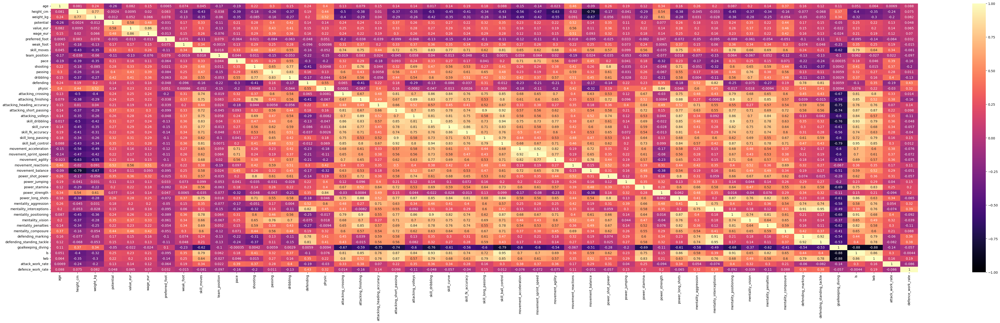

In [84]:
# Checking correlation between features using heatmap 

plt.figure(figsize=(60,15), dpi=100)

sns.heatmap(data_model.corr(),annot=True, cmap = "magma" , vmin = -1 , vmax = 1, center=0)

In [85]:
# Final shape of the dataset for model building

data_model.shape

(18278, 49)

In [86]:
data_model.head(5)

,age,height_cm,weight_kg,potential,value_eur,wage_eur,preferred_foot,weak_foot,skill_moves,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,goalkeeping_diving,ls,lwb,attack_work_rate,defence_work_rate
0,32,170,72,94,95500000,565000,0,4,4,25,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,6,89,68,0.5,0.0
1,34,187,83,93,58500000,405000,1,4,5,14,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,7,91,65,1.0,0.0
2,27,175,68,92,105500000,290000,1,5,5,0,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,9,84,66,1.0,0.5
3,26,188,87,93,77500000,125000,1,3,1,5,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,87,0,0,0.5,0.5
4,28,175,74,91,90000000,470000,1,4,4,14,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,11,83,66,1.0,0.5


The below code will identify those features that are the same in at least 90% of the instances.

In [87]:
data_model

,age,height_cm,weight_kg,potential,value_eur,wage_eur,preferred_foot,weak_foot,skill_moves,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,goalkeeping_diving,ls,lwb,attack_work_rate,defence_work_rate
0,32,170,72,94,95500000,565000,0,4,4,25,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,6,89,68,0.5,0.0
1,34,187,83,93,58500000,405000,1,4,5,14,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,7,91,65,1.0,0.0
2,27,175,68,92,105500000,290000,1,5,5,0,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,9,84,66,1.0,0.5
3,26,188,87,93,77500000,125000,1,3,1,5,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,87,0,0,0.5,0.5
4,28,175,74,91,90000000,470000,1,4,4,14,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,11,83,66,1.0,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,22,186,79,56,40000,2000,1,3,2,21,57.000000,23.000000,28.000000,33.000000,47.000000,51.000000,21,17,40,35,27,24,23,21,28,35,56,58,45,40,73,36,70,60,47,16,46,48,28,25,39,41,45,50,5,32,43,0.5,1.0
18274,22,177,66,56,40000,2000,1,2,2,28,58.000000,24.000000,33.000000,35.000000,48.000000,48.000000,24,20,42,43,28,32,24,29,39,31,55,61,43,41,76,33,72,55,44,20,42,49,23,25,37,35,42,53,13,33,44,0.5,0.5
18275,19,186,75,56,40000,1000,1,2,2,28,54.000000,35.000000,44.000000,45.000000,48.000000,51.000000,32,33,49,53,32,40,32,32,55,49,55,54,52,52,57,48,60,50,51,26,50,45,38,38,36,39,46,52,7,43,47,0.0,0.5
18276,18,185,74,54,40000,1000,1,2,2,28,59.000000,35.000000,47.000000,47.000000,45.000000,52.000000,39,34,47,54,28,42,37,39,48,49,55,63,55,54,59,46,61,42,55,28,57,49,31,48,36,40,39,44,14,43,48,0.0,0.0


### Scaling of the Data

In [88]:
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize

In [89]:
# Using Robust Scaler

r_scaler = preprocessing.RobustScaler()

In [90]:
data_r_scaler=r_scaler.fit_transform(data_model)

In [91]:
data_Final=pd.DataFrame(data_r_scaler) 

In [92]:
data_Final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 49 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       18278 non-null  float64
 1   1       18278 non-null  float64
 2   2       18278 non-null  float64
 3   3       18278 non-null  float64
 4   4       18278 non-null  float64
 5   5       18278 non-null  float64
 6   6       18278 non-null  float64
 7   7       18278 non-null  float64
 8   8       18278 non-null  float64
 9   9       18278 non-null  float64
 10  10      18278 non-null  float64
 11  11      18278 non-null  float64
 12  12      18278 non-null  float64
 13  13      18278 non-null  float64
 14  14      18278 non-null  float64
 15  15      18278 non-null  float64
 16  16      18278 non-null  float64
 17  17      18278 non-null  float64
 18  18      18278 non-null  float64
 19  19      18278 non-null  float64
 20  20      18278 non-null  float64
 21  21      18278 non-null  float64
 22

In [93]:
data_Final.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48
0,1.000000,-1.222222,-0.3,2.875,53.408451,80.285714,-1.0,1.0,2.0,0.181818,1.754464,2.205650,3.160566,3.042583,-0.52000,0.102120,1.307692,1.43750,0.70,2.142857,1.692308,2.000000,1.571429,2.12,1.714286,2.200000,1.263158,0.944444,1.421053,2.750000,1.611111,1.35,0.133333,0.500000,0.1250,1.433333,-0.40,-0.307692,1.56,1.95,1.238095,2.2500,-0.542857,-0.461538,-0.833333,2.0000,0.800000,0.0,-0.5
1,1.285714,0.666667,0.8,2.750,32.563380,57.428571,0.0,1.0,3.0,-0.818182,2.027191,2.261206,2.251475,2.406220,-0.68000,1.193029,1.153846,1.40625,1.65,1.500000,1.653846,1.555556,1.142857,1.40,1.000000,1.933333,1.157895,1.333333,1.105263,2.833333,0.277778,1.80,1.933333,1.055556,0.7500,1.400000,0.20,-0.589744,1.60,1.35,1.714286,2.1875,-0.685714,-0.589744,-0.666667,2.1250,0.600000,1.0,-0.5
2,0.285714,-0.666667,-0.7,2.625,59.042254,41.000000,0.0,2.0,3.0,-2.090909,2.118100,1.816761,2.706020,2.951674,-0.80000,-0.625153,1.269231,1.18750,0.30,1.785714,1.653846,1.944444,1.392857,1.84,1.190476,2.133333,1.421053,1.222222,1.578947,2.500000,1.000000,1.05,-0.333333,0.833333,-1.0625,1.100000,-0.28,-0.410256,1.28,1.75,1.952381,2.1250,-0.714286,-0.743590,-0.333333,1.6875,0.666667,1.0,0.0
3,0.142857,0.777778,1.2,2.750,43.267606,17.428571,0.0,0.0,-1.0,-1.636364,0.000000,0.000000,0.000000,0.000000,-0.01786,0.000000,-1.576923,-1.18750,-2.05,-1.357143,-1.192308,-2.722222,-1.285714,-1.08,-0.761905,-2.200000,-1.263158,-0.388889,0.052632,2.166667,-0.944444,0.00,0.800000,-1.388889,0.7500,-1.300000,-0.96,-0.846154,-1.76,0.50,-1.809524,0.5000,-0.714286,-1.102564,12.666667,-3.5625,-3.733333,0.0,0.0
4,0.428571,-0.666667,-0.1,2.500,50.309859,66.714286,0.0,1.0,2.0,-0.818182,2.118100,1.705650,2.615111,2.860765,-0.68000,0.102120,1.038462,1.09375,0.25,1.928571,1.500000,1.888889,1.214286,1.52,1.285714,2.066667,1.421053,1.166667,1.526316,2.333333,1.555556,1.15,-0.666667,1.000000,-0.1875,0.966667,-0.16,-0.282051,1.28,1.70,1.857143,1.9375,-0.514286,-0.717949,0.000000,1.6250,0.666667,1.0,0.0


In [94]:
data_Final.shape

(18278, 49)

### Dimentionality Reduction using Principal Component Analysis

In [95]:
from sklearn.decomposition import PCA
pca=PCA()

In [96]:
data_pca =pca.fit_transform(data_Final)

In [97]:
# The explained variance ratio is the percentage of variance that is attributed by each of the selected components.

explained_variance=pca.explained_variance_ratio_

print(explained_variance)

[4.22815048e-01 2.78974471e-01 7.83518346e-02 4.60066140e-02
 2.83649417e-02 2.48508065e-02 2.12225186e-02 1.12257705e-02
 9.00810388e-03 8.71792488e-03 6.59774472e-03 5.68788776e-03
 4.86639155e-03 4.26453530e-03 3.94017924e-03 3.41389070e-03
 3.22344073e-03 3.11503208e-03 2.90240229e-03 2.71269133e-03
 2.50328098e-03 2.37079130e-03 2.14916074e-03 2.06645274e-03
 1.95067904e-03 1.91463479e-03 1.70231026e-03 1.59507620e-03
 1.56703098e-03 1.35097865e-03 1.27073274e-03 1.17939100e-03
 1.02076494e-03 9.14928162e-04 8.48799876e-04 8.22506688e-04
 7.71961267e-04 7.41132447e-04 6.88374715e-04 5.39262501e-04
 5.19158001e-04 4.35571294e-04 2.69615658e-04 2.52062448e-04
 1.62660855e-04 7.72062493e-05 2.65907354e-05 1.90428935e-05
 7.61239248e-06]


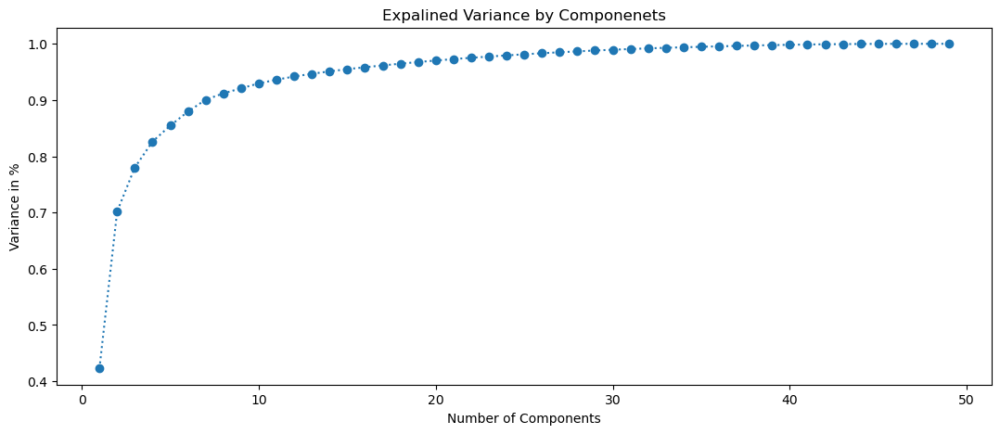

In [98]:
# Scree plot to get the optimum value of principal components

plt.figure(figsize=(13,5),dpi=100)

plt.plot(range(1,50), pca.explained_variance_ratio_.cumsum(), marker='o',linestyle='dotted')

plt.xlabel('Number of Components')
plt.ylabel('Variance in %') # for each component
plt.title('Expalined Variance by Componenets')
plt.show()

3 Components are enough to get close to 80% variance. Let's choose 3 as a Number of Principal Components

In [99]:
pca = PCA(n_components=3, random_state=42)
data_pca = pca.fit_transform(data_Final)

In [100]:
data_pca_df=pd.DataFrame(data_pca)

In [101]:
data_pca_df.columns = ['PC1', 'PC2', 'PC3']

In [102]:
data_pca_df.head()

,PC1,PC2,PC3
0,65.821373,62.963483,8.214552
1,45.823555,41.293929,5.548369
2,50.771196,46.588193,2.221256
3,18.351616,39.642235,1.801655
4,57.525352,55.255714,6.116808


## Model Building

### Agglomerative Hierarchical Clustering

Silhouette score is a metric used to calculate the goodness of a clustering technique. Its value ranges from -1 to 1. 1: Means clusters are well apart from each other and clearly distinguished

In [137]:
data_pca_df.head()

,PC1,PC2,PC3
0,65.821373,62.963483,8.214552
1,45.823555,41.293929,5.548369
2,50.771196,46.588193,2.221256
3,18.351616,39.642235,1.801655
4,57.525352,55.255714,6.116808


**Finding Number of clusters using Dendrogram**

The x-axis contains the samples and y-axis represents the distance between these samples. Using Dendrogram, we will now determine the optimal number of clusters for our model. For this, we will find the maximum vertical distance that does not cut any horizontal bar.

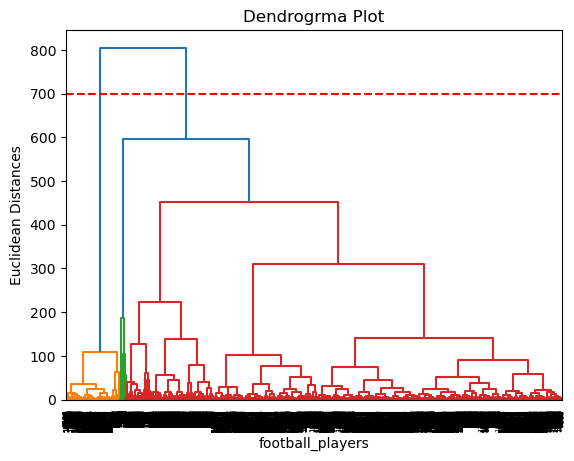

In [138]:
#Finding the optimal number of clusters using the dendrogram  
import scipy.cluster.hierarchy as shc  
dendro = shc.dendrogram(shc.linkage(data_pca_df, method="ward"))  
plt.axhline(y=700, color='r', linestyle='--')
plt.title("Dendrogrma Plot")  
plt.ylabel("Euclidean Distances")  
plt.xlabel("football_players")  
plt.show()

We have two clusters as this line cuts the dendrogram at two points. Let’s now apply hierarchical clustering for 2 clusters:

In [139]:
# Implementing the Model

from sklearn.cluster import AgglomerativeClustering

data_agg_clustered= AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
data_agg_clustered.fit_predict(data_pca_df)
data_agg_clustered_df=pd.DataFrame(data_pca_df.copy())
data_agg_clustered_df.loc[:,'Cluster'] = data_agg_clustered.labels_

In [140]:
silhouette_score(data_pca_df, data_agg_clustered.labels_)

0.6635289576988512

In [141]:
Hier_clust_sizes = data_agg_clustered_df.groupby('Cluster').size().to_frame()
Hier_clust_sizes.columns = ["Hier_size"]
Hier_clust_sizes

,Hier_size
Cluster,
0,16262
1,2016


In [142]:
data_agg_clustered_df.head()

,PC1,PC2,PC3,Cluster
0,65.821373,62.963483,8.214552,0
1,45.823555,41.293929,5.548369,0
2,50.771196,46.588193,2.221256,0
3,18.351616,39.642235,1.801655,0
4,57.525352,55.255714,6.116808,0


Scatter plots for Visualising our Clusters

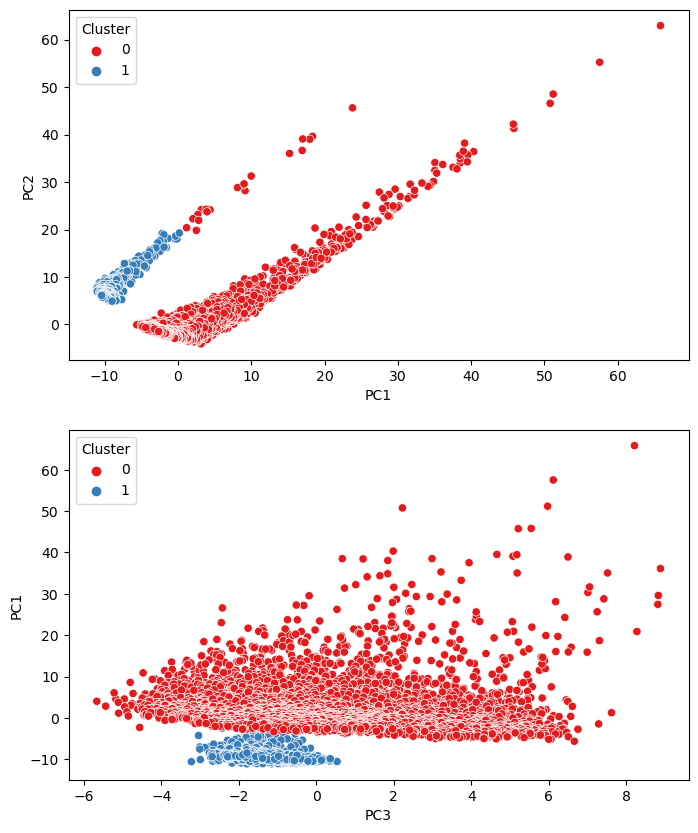

In [143]:
fig1, (axes) = plt.subplots(2,1,figsize=(8,10))


scat_1 = sns.scatterplot('PC1', 'PC2', data=data_agg_clustered_df,
                hue='Cluster', ax=axes[0], palette='Set1', legend='full')

sns.scatterplot('PC3', 'PC1', data=data_agg_clustered_df,
                hue='Cluster', palette='Set1', ax=axes[1], legend='full')

plt.show()

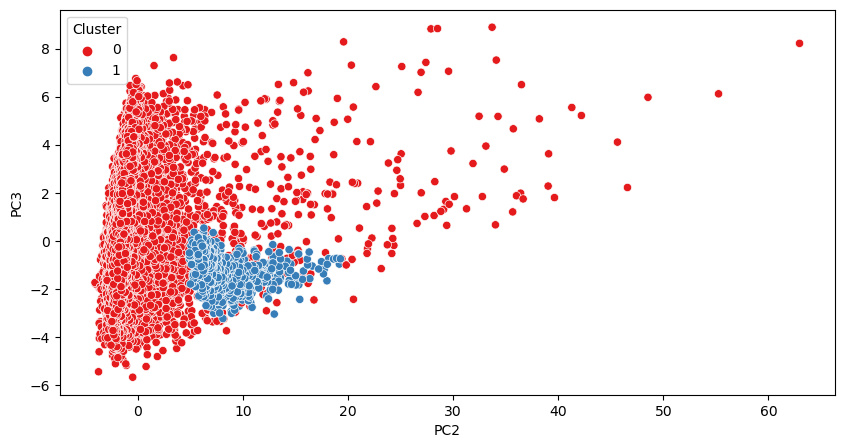

In [144]:
plt.figure(figsize=(10,5))
sns.scatterplot('PC2', 'PC3', data=data_agg_clustered_df,
                hue='Cluster', palette='Set1', legend='full')
plt.show()

Cluster No. 0 has more number of players compared to Cluster No. 1

In [145]:
# 3D Plot for visualising Clusters

Scene = dict(xaxis = dict(title  = 'P1'),yaxis = dict(title  = 'P2'),zaxis = dict(title  = 'P3'))
labels = data_agg_clustered.labels_
trace = go.Scatter3d(x=data_agg_clustered_df.iloc[:,0], y=data_agg_clustered_df.iloc[:,1], z=data_agg_clustered_df.iloc[:,2], 
                     mode='markers', marker=dict(color = labels, colorscale='rainbow', 
                                                size = 3, line = dict(color = 'gray',width = 5)))
layout = go.Layout(scene = Scene, height =750,width = 1000)
dt2 = [trace]
fig = go.Figure(dt2, layout = layout)
fig.update_layout(title='Agg Hierarchial Clustering', font=dict(size=12,))
fig.show()